# **Part 3: Quantifying Bias of the Models Without Upsampling The Race**

In Part 3 of the study, we evaluate the extent of demographic bias present in the trained machine learning models **without applying any corrective upsampling techniques** to address class imbalance in race representation. Using the original dataset distribution, we analyze model predictions across key demographic groups—specifically **sex, race, device type and dominant hand**—to determine disparities in performance.

Bias is quantified using established fairness metrics such as **Disparate Impact, Equal Opportunity, and Equalized Odds Difference**. Additionally, group-level performance metrics (F1 Score, Sensitivity, Specificity, and AUC) are compared between privileged and unprivileged groups to identify potential inequities in predictive outcomes.

This analysis serves as a baseline for understanding how the current dataset and model configurations may propagate or reflect existing biases, laying the foundation for mitigation strategies explored in subsequent phases of the research.

### **Installing Libraries**

In [ ]:
!pip install aif360

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **Importing Necessary Modules**

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import drive
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_validate, cross_val_predict, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, recall_score
from sklearn.utils import resample
from collections import Counter

from aif360.datasets import BinaryLabelDataset

In [ ]:
try:
    from google.colab import drive
    drive.mount('/content/drive/')
    %cd '/content/drive/MyDrive/Parkinson Paper/'
    COLAB = True
    project_url = './'
except:
    COLAB = False
    project_url = './'

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
data = pd.read_csv(f'{project_url}/data/final/dataset.csv', index_col=None)
data["Parkinson's Disease status"] = data["Parkinson's Disease status"].replace('suspectedpd', 'pd')

In [ ]:
def percent_with_num(values):
    def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
    return my_format

In [ ]:
print("Number of Records before Handling Missnig Values: ", data.shape[0])
print("Columns with null values:")
data.isnull().sum()

Number of Records before Handling Missnig Values:  266
Columns with null values:


,0
Parkinson's Disease status,5
Age,5
Gender,5
Race,5
M_deviation,0
...,...
Number of correctly pressed keys when prompted with a constant key with respect to average response time,0
Number of correctly pressed keys when prompted with a semi-random key with respect to average response time,0
Ratio_Points_Sine_Straight,0
Ratio_Points_Spiral_Straight,0


In [ ]:
data = data.dropna()
print("Number of Records After Handling Missnig Values: ", data.shape[0])
print("Columns with null values:")
data.isnull().sum()


Number of Records After Handling Missnig Values:  251
Columns with null values:


,0
Parkinson's Disease status,0
Age,0
Gender,0
Race,0
M_deviation,0
...,...
Number of correctly pressed keys when prompted with a constant key with respect to average response time,0
Number of correctly pressed keys when prompted with a semi-random key with respect to average response time,0
Ratio_Points_Sine_Straight,0
Ratio_Points_Spiral_Straight,0


### **Exploratory Data Analysis**

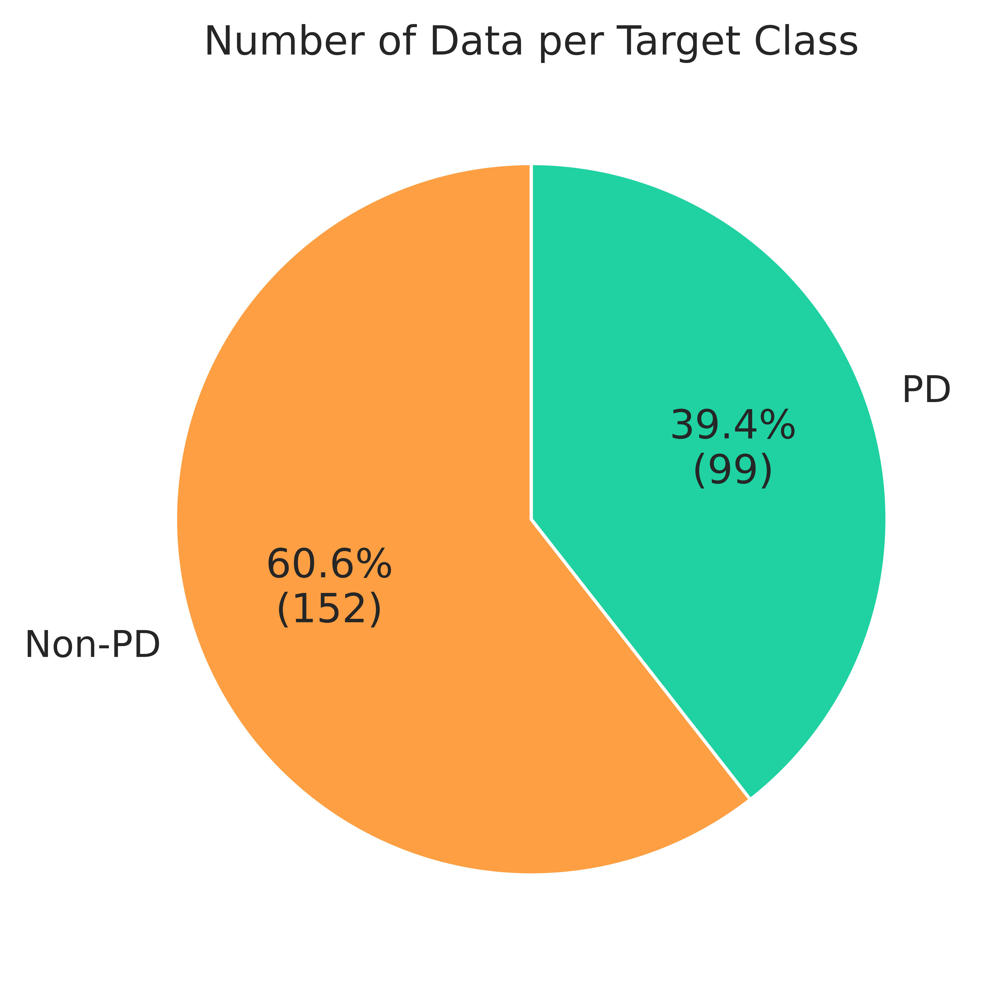

In [ ]:
sns.set()

plt.figure(dpi=1200)
counts = data["Parkinson's Disease status"].value_counts()
counts = counts.rename(index={"pd": "PD", "nonpd": "Non-PD"})
plt.pie(counts, labels=counts.index, autopct=percent_with_num(counts), startangle=90, colors=["#ff9f43", "#1dd1a1"])
plt.title("Number of Data per Target Class")
sns.set_style("whitegrid")
sns.despine()
plt.show()

In [ ]:
plt.figure(dpi=1200)
heatmap_data = data.pivot_table(index='Race', columns="Parkinson's Disease status", aggfunc='size', fill_value=0)
heatmap_data = heatmap_data.rename(columns={"pd": "PD", "nonpd": "Non-PD"})

sns.heatmap(heatmap_data, annot=True, cmap='Oranges', fmt='d')
plt.title('Heatmap of Race Distribution by Disease Status')
plt.xlabel('Disease Status')
plt.ylabel('Race')
plt.show()

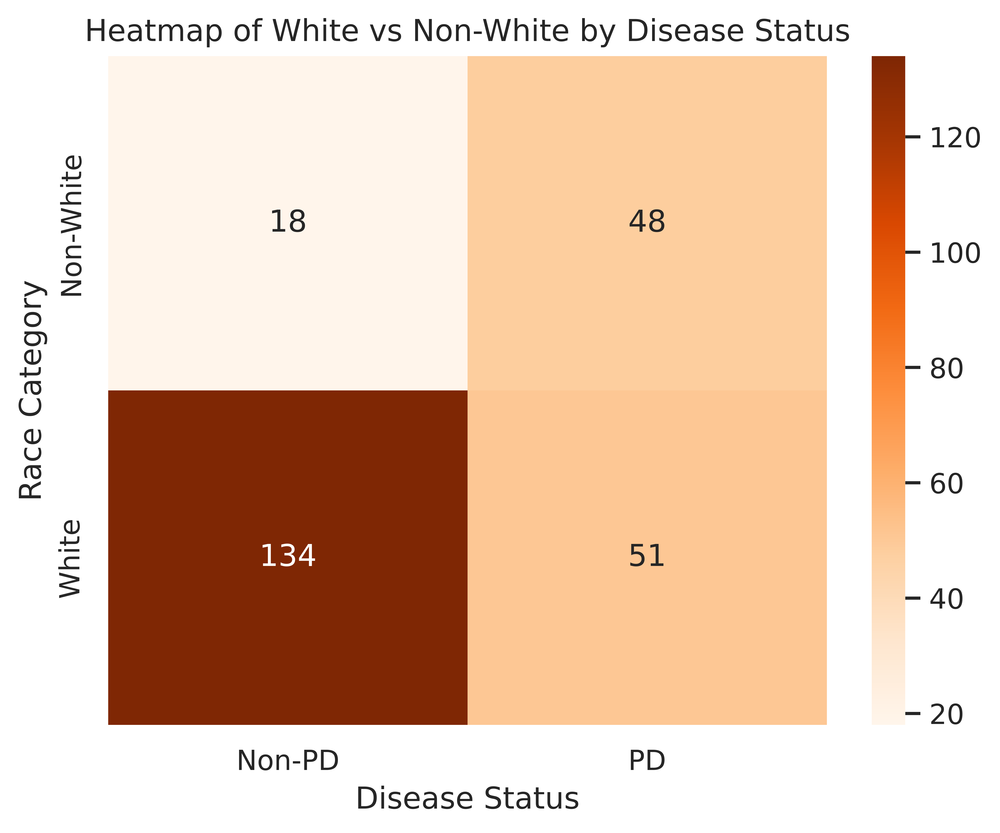

In [ ]:
heatmap_data = data.groupby([
    data['Race'].map(lambda x: 'White' if x == 'White' else 'Non-White'),
    data["Parkinson's Disease status"]
]).size().unstack(fill_value=0)

heatmap_data = heatmap_data.rename(columns={"pd": "PD", "nonpd": "Non-PD"})
plt.figure(dpi=1200)
sns.heatmap(heatmap_data, annot=True, cmap='Oranges', fmt='d')
plt.title('Heatmap of White vs Non-White by Disease Status')
plt.xlabel('Disease Status')
plt.ylabel('Race Category')
plt.show()

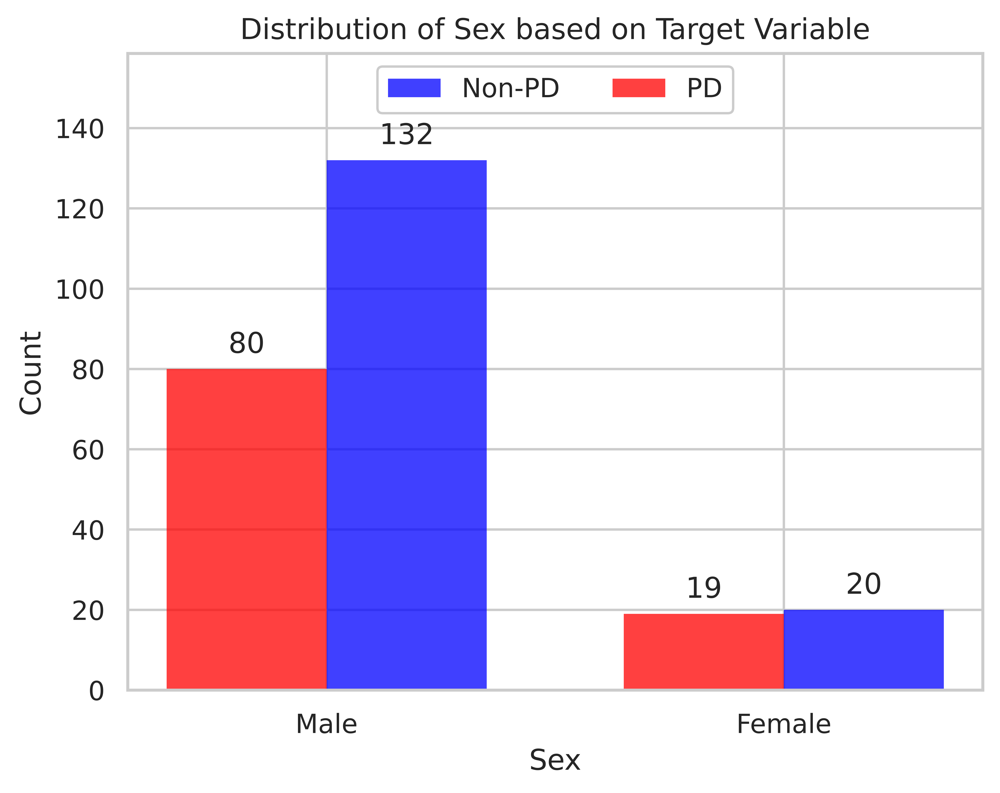

In [ ]:
plt.figure(dpi=1200)
ax = sns.histplot(data=data, x='Gender', hue="Parkinson's Disease status", shrink=0.7, multiple='dodge', linewidth=0, bins=10, palette=["red", "blue"])
plt.title('Distribution of Sex based on Target Variable')
plt.legend(["Non-PD", "PD"], loc=9, facecolor='white', framealpha=1, ncol=2)
plt.xlabel('Sex')
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 20))
plt.show()

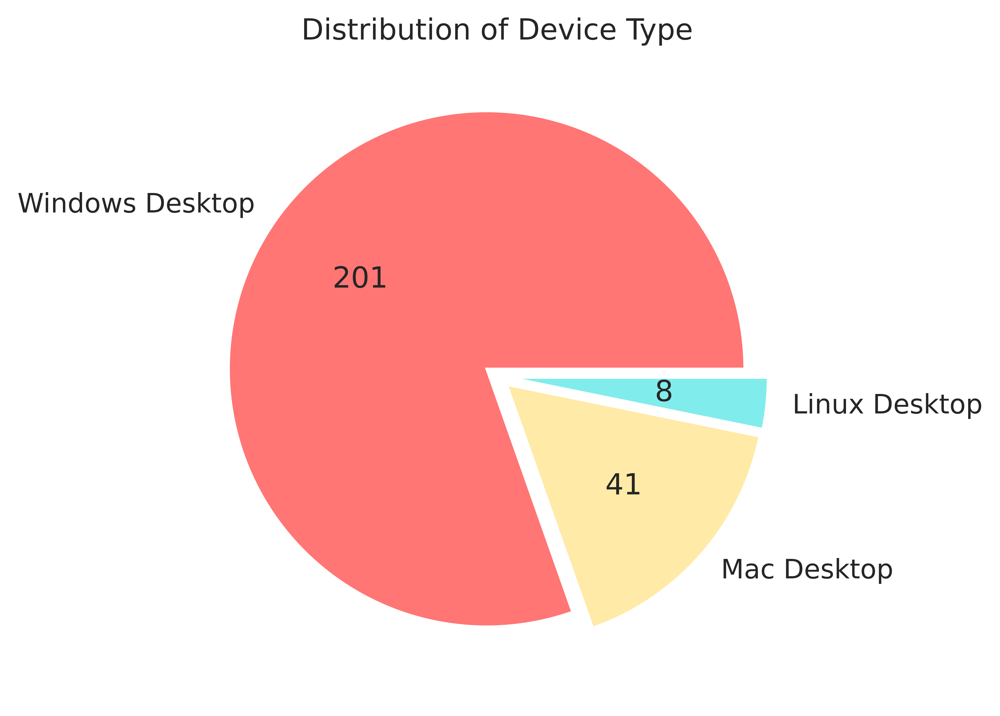

In [ ]:
plt.figure(dpi=1200)
device_counts = data['Device_type'].value_counts()
device_counts = device_counts[device_counts.index != 'Desktop']

labels = [f'{device_type} ({count})' for device_type, count in zip(device_counts.index, device_counts.values)]
explode = [0.05] * len(device_counts)

device_counts.plot.pie(autopct=percent_with_num(counts), colors=["#ff7675", "#ffeaa7", "#81ecec", "#6c5ce7"], explode=explode)
plt.title('Distribution of Device Type')
plt.ylabel('')
plt.show()

## **Mapping Protected Attributes**

In [ ]:
race_mapping = {'White': "White", "Black or African American": "Others",
                "American Indian or Alaska Native": "Others", "Asian": "Others",
                "Native Hawaiian or Other Pacific Islander": "Others", "Prefer not to specify": "Others"}

# race_mapping = {'White': "White", "Black or African American": "Others",
# "American Indian or Alaska Native": "Others"}

data.loc[:, 'Race'] = data['Race'].map(race_mapping)

gender_mapping = {'Male': 1.0, 'Female': 0.0}
race_mapping = {'White': 1.0, "Others": 0.0}
device_mapping = {"Windows Desktop": 0.0, "Mac Desktop": 1.0, "Linux Desktop": 0.0, "Desktop": 0.0}
dominantHand_mapping = {"Right": 1.0, "Left": 0.0}

data.loc[:, 'Sex_protected'] = data['Gender'].map(gender_mapping)
data.loc[:, 'Ethnicity_protected'] = data['Race'].map(race_mapping)
data.loc[:, 'Platform_protected'] = data['Device_type'].map(device_mapping)
data.loc[:, 'Preferred_hand_protected'] = data['Dominant_hand'].map(dominantHand_mapping)
final_data = data

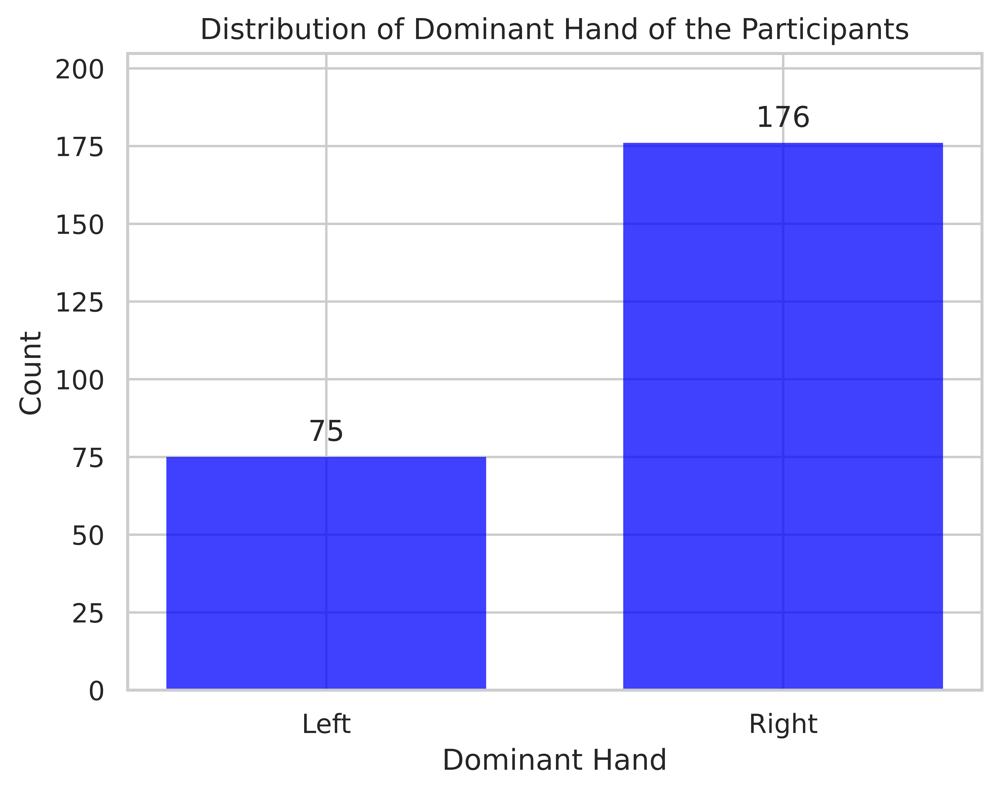

In [ ]:
plt.figure(dpi=1200)
ax = sns.histplot(data=final_data, x='Dominant_hand', shrink=0.7, multiple='dodge', linewidth=0, bins=10, color='blue')
plt.title('Distribution of Dominant Hand of the Participants')
plt.xlabel('Dominant Hand')
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 20))

plt.show()

<ipython-input-21-960fcfa4cb4d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Device_type'] = filtered_data['Device_type'].map({'Mac Desktop': 'Mac', 'Windows Desktop': 'Windows'})


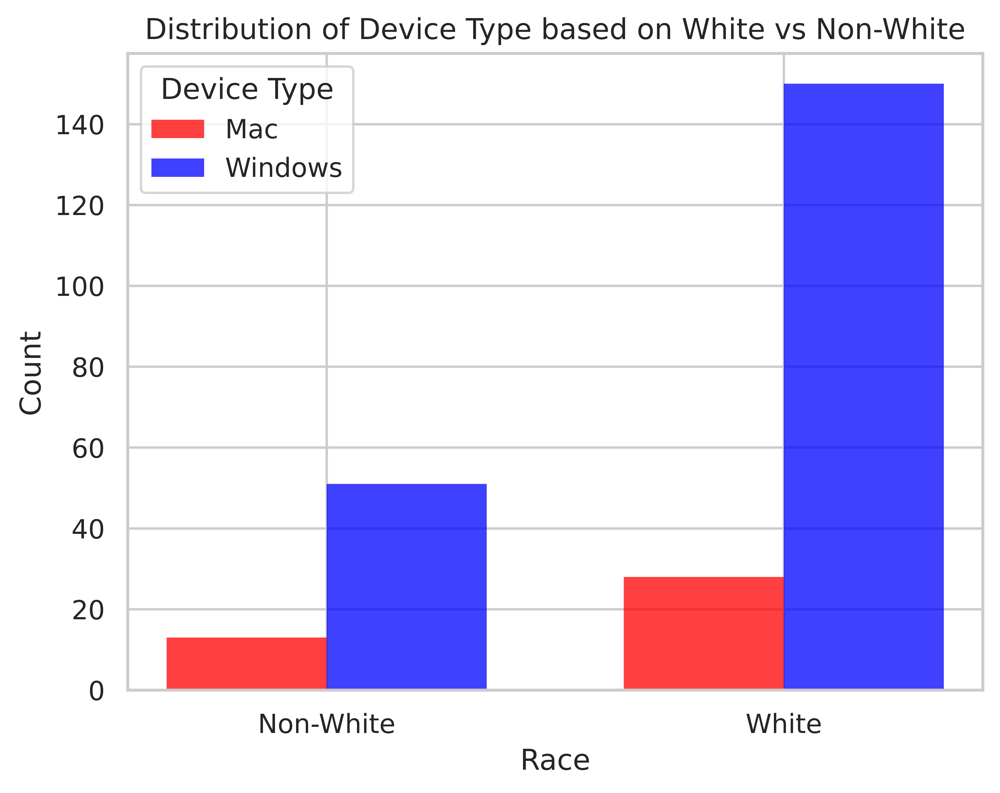

In [ ]:
filtered_data = final_data[final_data['Device_type'].isin(['Mac Desktop', 'Windows Desktop'])]
filtered_data['Device_type'] = filtered_data['Device_type'].map({'Mac Desktop': 'Mac', 'Windows Desktop': 'Windows'})
filtered_data = filtered_data.rename(columns={"Device_type": "Device Type"})


plt.figure(dpi=1200)

ax = sns.histplot(
    data=filtered_data,
    x=filtered_data['Race'].map(lambda x: 'White' if x == 'White' else 'Non-White'),
    hue="Device Type",
    shrink=0.7,
    multiple='dodge',
    linewidth=0,
    bins=10,
    palette=["red", "blue"]
)

plt.title('Distribution of Device Type based on White vs Non-White')
plt.xlabel('Race')
plt.ylabel('Count')
plt.show()

In [ ]:
final_data = final_data.dropna()
final_data.isna().sum().sum()

0

In [ ]:
final_data = final_data[final_data['Device_type'] != 'Linux Desktop']
final_data = final_data[final_data['Device_type'] != 'Desktop']
final_data

,Parkinson's Disease status,Age,Gender,Race,M_deviation,A_tcl,A_tslww,P_isl,N_tislnt,A_tsw,...,Interaction_Time_Spiral_False_presses,Number of correctly pressed keys when prompted with a constant key with respect to average response time,Number of correctly pressed keys when prompted with a semi-random key with respect to average response time,Ratio_Points_Sine_Straight,Ratio_Points_Spiral_Straight,Ratio_Points_Sine_Spiral,Sex_protected,Ethnicity_protected,Platform_protected,Preferred_hand_protected
1,nonpd,58.0,Male,White,-0.000934,1500,1.169135,1.000000,3,3500,...,2000,0.001791,0.002354,0.857143,0.750000,1.142857,1.0,1.0,0.0,0.0
2,pd,67.0,Female,White,0.018477,10500,5.468750,1.000000,21,25000,...,0,0.001667,0.001333,0.200000,0.346154,0.577778,0.0,1.0,0.0,1.0
3,nonpd,61.0,Male,White,0.002205,1000,0.779423,1.000000,2,3500,...,0,0.001790,0.000456,0.714286,0.750000,0.952381,1.0,1.0,0.0,0.0
4,pd,62.0,Male,White,0.102513,3500,1.822917,0.285714,2,16500,...,42000,0.009050,0.010077,0.848485,2.250000,0.377104,1.0,1.0,0.0,1.0
5,nonpd,62.0,Male,White,-0.000635,1500,1.169135,1.000000,3,3500,...,0,0.001425,0.002354,0.571429,0.074074,7.714286,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257,nonpd,53.0,Male,White,0.004447,1000,0.779423,1.000000,2,3500,...,0,0.001621,0.002582,0.571429,0.750000,0.761905,1.0,1.0,0.0,0.0
258,nonpd,66.0,Male,White,0.008034,1500,1.169135,1.000000,3,3000,...,0,0.003152,0.002555,0.666667,1.000000,0.666667,1.0,1.0,0.0,0.0
259,nonpd,65.0,Male,White,0.004795,6000,3.906250,1.000000,12,18000,...,5500,0.010485,0.010933,0.916667,0.818182,1.120370,1.0,1.0,0.0,1.0
260,nonpd,82.0,Male,White,-0.009453,11000,7.638889,0.863636,19,17500,...,495000,0.003964,0.011319,0.760902,1.157895,0.657143,1.0,1.0,1.0,1.0


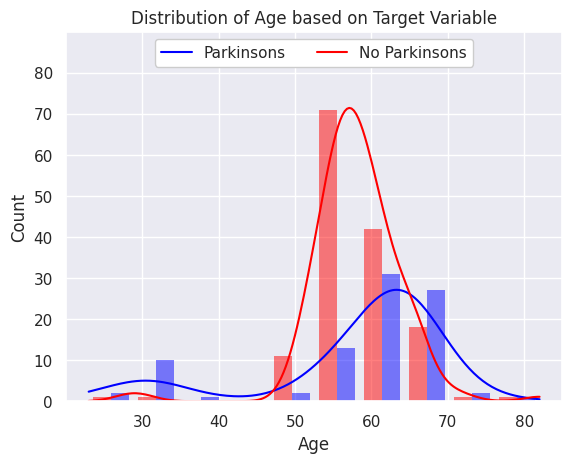

In [ ]:
sns.set()

sns.histplot(data=final_data, x='Age', hue="Parkinson's Disease status", multiple='dodge', shrink=0.8, kde=True, linewidth=0, bins=10, palette=["red", "blue"])
plt.legend(["Parkinsons", "No Parkinsons"], loc=9, facecolor='white', framealpha=1, ncol=2)
plt.title('Distribution of Age based on Target Variable')
plt.xlabel('Age')
plt.ylabel('Count')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 15))

plt.show()

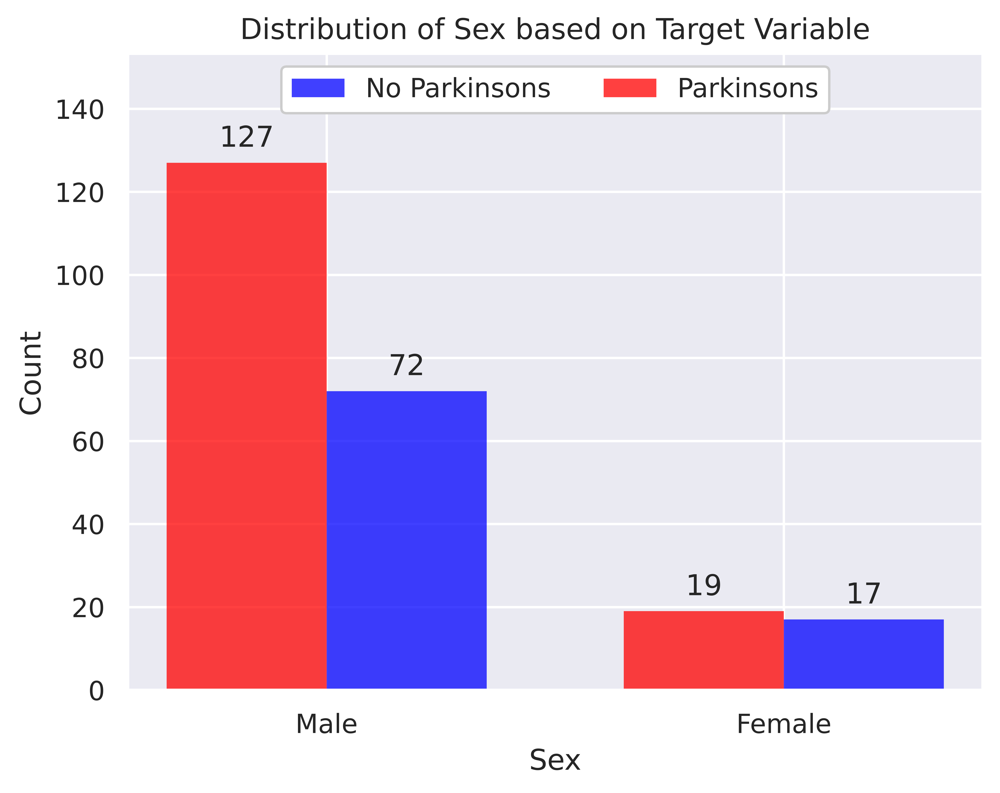

In [ ]:
plt.figure(dpi=1200)
ax = sns.histplot(data=final_data, x='Gender', hue="Parkinson's Disease status", shrink=0.7, multiple='dodge', linewidth=0, bins=10, palette=["red", "blue"])
plt.title('Distribution of Sex based on Target Variable')
plt.legend(["No Parkinsons", "Parkinsons"], loc=9, facecolor='white', framealpha=1, ncol=2)
# plt.legend(["Parkinson" if label == "pd" else "No Parkinson" for label in ["pd", "nonpd"]], loc=9, facecolor='white', framealpha=1, ncol=2)
plt.xlabel('Sex')
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 20))
plt.show()

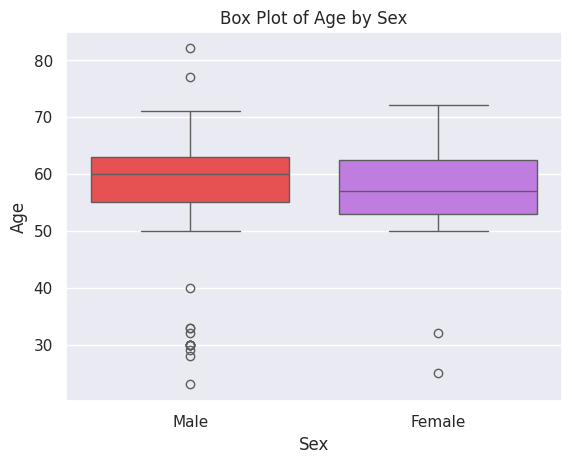

In [ ]:
sns.boxplot(x='Gender', y='Age', hue='Gender', data=final_data, palette=["#ff3838", "#c56cf0"])
plt.title('Box Plot of Age by Sex')
plt.xlabel('Sex')
plt.ylabel('Age')

plt.show()

In [ ]:
final_data['Device_type'].value_counts()

,count
Device_type,
Windows Desktop,195
Mac Desktop,40


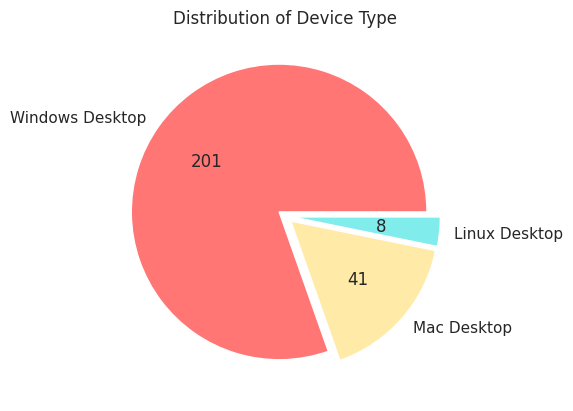

In [ ]:
device_counts = data['Device_type'].value_counts()
device_counts = device_counts[device_counts.index != 'Desktop']

labels = [f'{device_type} ({count})' for device_type, count in zip(device_counts.index, device_counts.values)]
explode = [0.05] * len(device_counts)

def percent_with_num(values):
    def my_format(pct):
            total = sum(values)
            val = int(pct*total/100.0)
            return '{v:d}'.format(v=val)
    return my_format

device_counts.plot.pie(autopct=percent_with_num(counts), colors=["#ff7675", "#ffeaa7", "#81ecec", "#6c5ce7"], explode=explode)
plt.title('Distribution of Device Type')
plt.ylabel('')
plt.show()

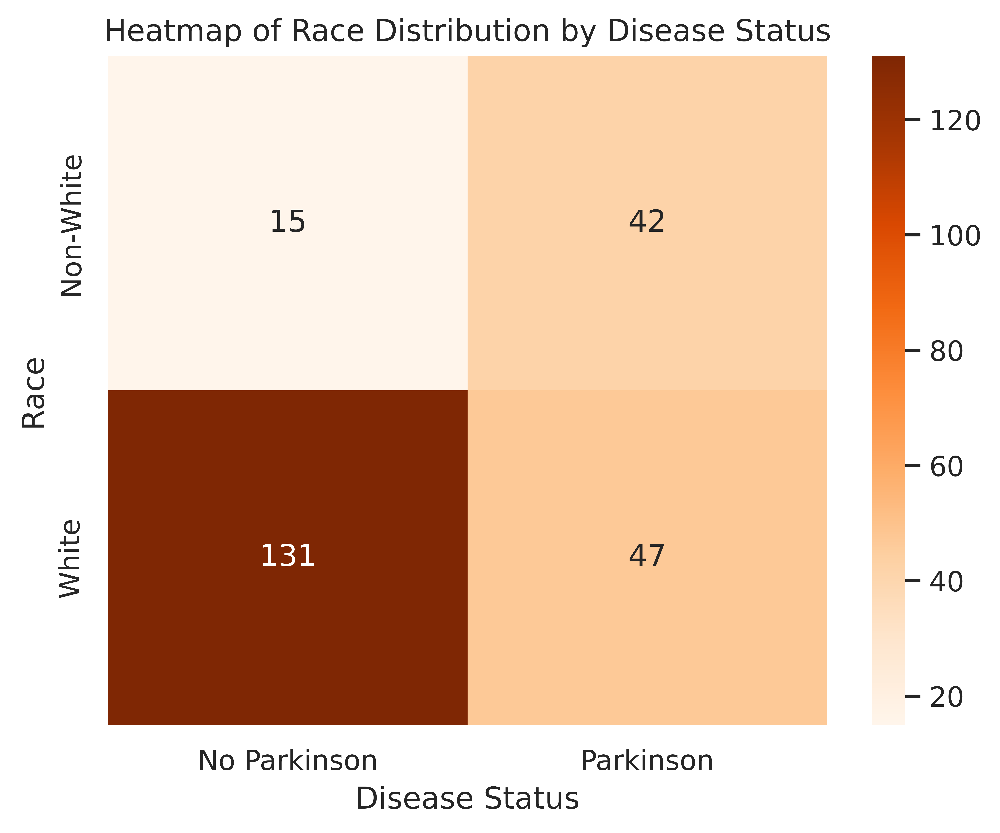

In [ ]:
plt.figure(dpi=1200)
heatmap_data = final_data.pivot_table(index='Race', columns="Parkinson's Disease status", aggfunc='size', fill_value=0)
heatmap_data = heatmap_data.rename(columns={"pd": "Parkinson", "nonpd": "No Parkinson"})

sns.heatmap(heatmap_data, annot=True, cmap='Oranges', fmt='d')
plt.title('Heatmap of Race Distribution by Disease Status')
plt.xlabel('Disease Status')
plt.ylabel('Race')

current_labels = plt.gca().get_yticklabels()
new_labels = ["Non-White" if label.get_text() == "Others" else label.get_text() for label in current_labels]
plt.gca().set_yticklabels(new_labels)

plt.show()


<ipython-input-30-ab86d48ec320>:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.gca().set_xticklabels(new_labels)


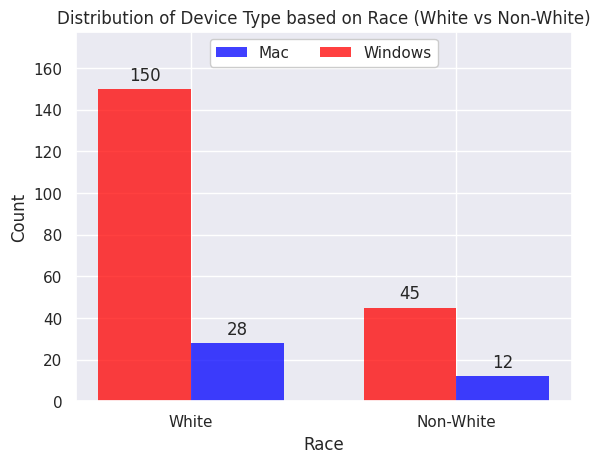

In [ ]:
ax = sns.histplot(data=final_data, x='Race', hue="Device_type", shrink=0.7, multiple='dodge', linewidth=0, bins=10, palette=["red", "blue"])
plt.title('Distribution of Device Type based on Race (White vs Non-White)')
plt.legend(["Mac", "Windows"], loc=9, facecolor='white', framealpha=1, ncol=2)
plt.xlabel('Race')
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 20))

current_labels = plt.gca().get_xticklabels()
new_labels = ["Non-White" if label.get_text() == "Others" else label.get_text() for label in current_labels]
plt.gca().set_xticklabels(new_labels)

plt.show()

### **Feature Encoding, Balancing and Normalizing**

In [ ]:
final_data = final_data.reset_index()
featureset = final_data.drop("Parkinson's Disease status", axis=1)
label = final_data["Parkinson's Disease status"]

In [ ]:
le = LabelEncoder()
label_encoded = le.fit_transform(label)

In [ ]:
categorical_columns = featureset.select_dtypes(include=['object']).columns
featureset = pd.get_dummies(featureset, columns=categorical_columns, prefix=categorical_columns).astype(float)

In [ ]:
from imblearn.over_sampling import SMOTE, RandomOverSampler
from collections import Counter

smote = SMOTE(random_state=67)

X_res, y_res = smote.fit_resample(featureset, label_encoded)
X_train, y_train = X_res, y_res

In [ ]:
X_train

,index,Age,M_deviation,A_tcl,A_tslww,P_isl,N_tislnt,A_tsw,A_tww,P_ptsw,...,Platform_protected,Preferred_hand_protected,Gender_Female,Gender_Male,Race_Others,Race_White,Dominant_hand_Left,Dominant_hand_Right,Device_type_Mac Desktop,Device_type_Windows Desktop
0,1.000000,58.000000,-0.000934,1500.000000,1.169135,1.000000,3.000000,3500.000000,2.727981,0.857143,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
1,2.000000,67.000000,0.018477,10500.000000,5.468750,1.000000,21.000000,25000.000000,13.020833,0.200000,...,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2,3.000000,61.000000,0.002205,1000.000000,0.779423,1.000000,2.000000,3500.000000,2.727981,0.714286,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
3,4.000000,62.000000,0.102513,3500.000000,1.822917,0.285714,2.000000,16500.000000,8.593750,0.242424,...,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
4,5.000000,62.000000,-0.000635,1500.000000,1.169135,1.000000,3.000000,3500.000000,2.727981,0.571429,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,132.649031,52.771586,0.059406,6156.685014,3.426220,0.620474,7.000000,18211.002182,10.175110,0.564017,...,0.000000,1.000000,0.759053,0.240947,0.240947,0.759053,0.000000,1.000000,0.000000,1.000000
288,126.223473,64.547026,0.020678,3532.355304,1.778147,0.991911,7.000000,11308.882590,5.828757,0.544777,...,0.064711,1.000000,0.000000,1.000000,0.935289,0.064711,0.000000,1.000000,0.064711,0.935289
289,140.802440,75.219756,0.019894,5054.938990,2.534227,0.861887,8.813171,20752.682555,9.885810,0.424658,...,0.296707,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.296707,0.703293
290,100.325126,59.034757,0.010301,3593.048561,2.495173,0.793797,5.593049,8520.456383,5.916984,0.553510,...,1.000000,0.296524,0.296524,0.703476,0.000000,1.000000,0.703476,0.296524,1.000000,0.000000


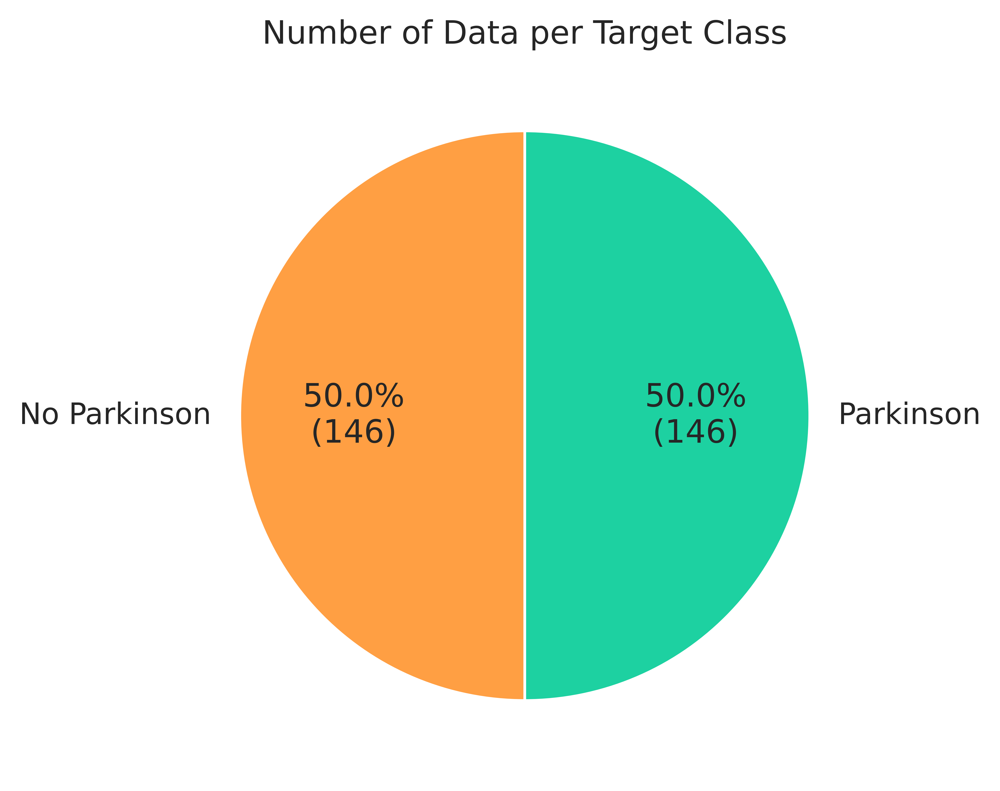

In [ ]:
sns.set()

plt.figure(dpi=1200)
def percent_with_num(values):
    def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
    return my_format

counts = Counter(y_train)

counts = pd.Series(counts).rename(index={1: "Parkinson", 0: "No Parkinson"})

plt.pie(counts, labels=counts.index, autopct=percent_with_num(counts), startangle=90, colors=["#ff9f43", "#1dd1a1"])
plt.title("Number of Data per Target Class")

sns.set_style("whitegrid")
sns.despine()
plt.show()

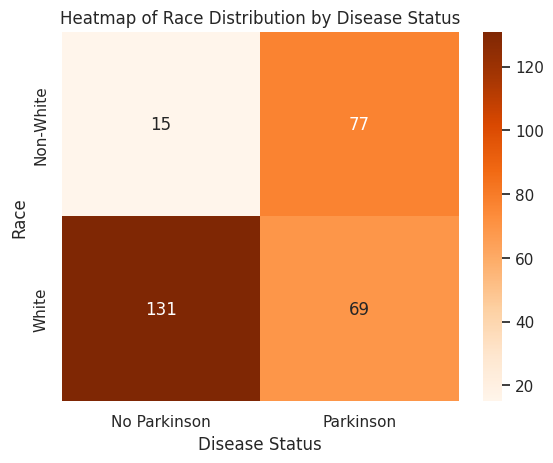

In [ ]:
label = pd.Series(y_train).map({1: "Parkinson", 0: "No Parkinson"})

combined_data = X_train.assign(
    Race=np.where(X_train['Race_White'] > 0.5, 'White', 'Others'),
    Label=label
)

heatmap_data = combined_data.pivot_table(index='Race', columns="Label", aggfunc='size', fill_value=0)
sns.heatmap(heatmap_data, annot=True, cmap='Oranges', fmt='d')
plt.title('Heatmap of Race Distribution by Disease Status')
plt.xlabel('Disease Status')
plt.ylabel('Race')

current_labels = plt.gca().get_yticklabels()
new_labels = ["Non-White" if label.get_text() == "Others" else label.get_text() for label in current_labels]
plt.gca().set_yticklabels(new_labels)

plt.show()


In [ ]:
label = pd.Series(y_train).map({1: "Parkinson", 0: "No Parkinson"})

conditions = [
    (X_train['Race_White'] > 0.5),
    (X_train['Race_Black or African American'] > 0.5),
    (X_train['Race_American Indian or Alaska Native'] > 0.5),
    (X_train['Race_Asian'] > 0.5),
    (X_train['Race_Native Hawaiian or Other Pacific Islander'] > 0.5),
    (X_train['Race_Prefer not to specify'] > 0.5)
]
choices = ['White', 'Black or African American', 'American Indian or Alaska Native', 'Asian', 'Native Hawaiian or Other Pacific Islander', 'Prefer not to specify']

combined_data = X_train.assign(
    Race=np.select(conditions, choices, default="Others"),
    Label=label
)

plt.figure(dpi=1200)
heatmap_data = combined_data.pivot_table(index='Race', columns="Label", aggfunc='size', fill_value=0)
sns.heatmap(heatmap_data, annot=True, cmap='Oranges', fmt='d')
plt.title('Heatmap of Race Distribution by Disease Status')
plt.xlabel('Disease Status')
plt.ylabel('Race')

current_labels = plt.gca().get_yticklabels()
new_labels = ["Non-White" if label.get_text() == "Others" else label.get_text() for label in current_labels]
plt.gca().set_yticklabels(new_labels)

plt.show()

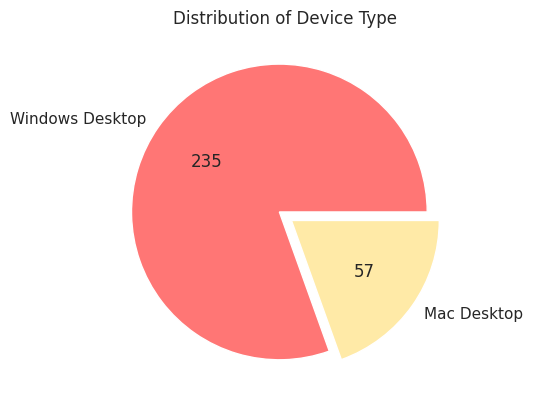

In [ ]:
device_counts = X_train.assign(Device_type=np.where(X_train['Device_type_Mac Desktop'] > 0.5, 'Mac Desktop', 'Windows Desktop'))['Device_type'].value_counts()
labels = [f'{device_type} ({count})' for device_type, count in zip(device_counts.index, device_counts.values)]
explode = [0.05] * len(device_counts)

def percent_with_num(values):
    def my_format(pct):
            total = sum(values)
            val = int(pct*total/100.0)
            return '{v:d}'.format(v=val)
    return my_format

device_counts.plot.pie(autopct=percent_with_num(counts), colors=["#ff7675", "#ffeaa7", "#81ecec", "#6c5ce7"], explode=explode)
plt.title('Distribution of Device Type')
plt.ylabel('')
plt.show()

<ipython-input-41-75e78bc3f3a6>:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.gca().set_xticklabels(new_labels)


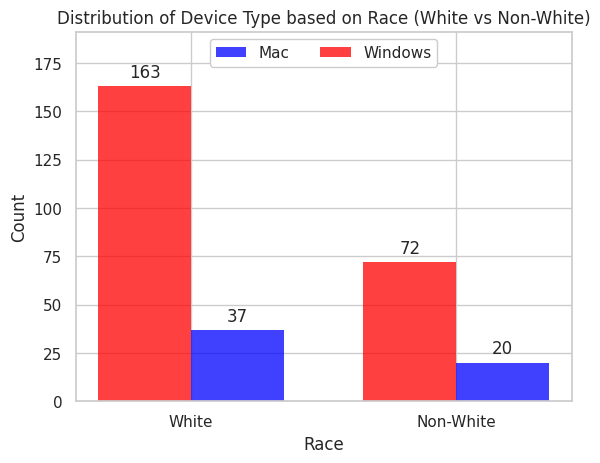

In [ ]:
combined_data = X_train.assign(Race=np.where(X_train['Race_White'] > 0.5, 'White', 'Others'))
combined_data['Device_type'] = X_train.assign(Device_type=np.where(X_train['Device_type_Windows Desktop'] > 0.5, 'Windows', 'Mac'))['Device_type']
combined_data["Parkinson's Disease status"] = pd.Series(y_train).map({1: "Parkinson", 0: "No Parkinson"})
ax = sns.histplot(data=combined_data, x='Race', hue="Device_type", shrink=0.7, multiple='dodge', linewidth=0, bins=10, palette=["red", "blue"])
plt.title('Distribution of Device Type based on Race (White vs Non-White)')
plt.legend(["Mac", "Windows"], loc=9, facecolor='white', framealpha=1, ncol=2)
plt.xlabel('Race')
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 20))

current_labels = plt.gca().get_xticklabels()
new_labels = ["Non-White" if label.get_text() == "Others" else label.get_text() for label in current_labels]
plt.gca().set_xticklabels(new_labels)

plt.show()

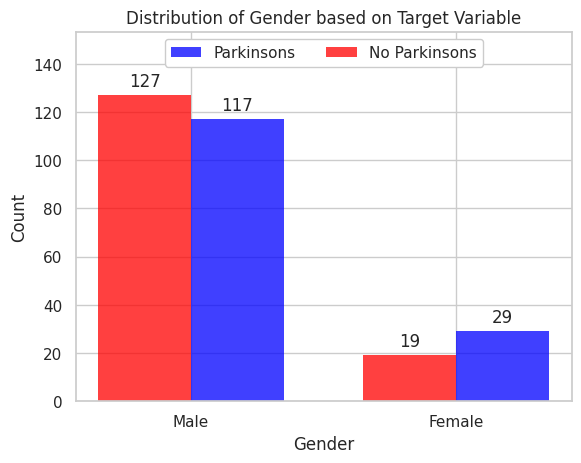

In [ ]:
combined_data = X_train.assign(Gender=np.where(X_train['Gender_Male'] > 0.5, 'Male', 'Female'))
combined_data["Parkinson's Disease status"] = pd.Series(y_train).map({1: "Parkinson", 0: "No Parkinson"})
ax = sns.histplot(data=combined_data, x='Gender', hue="Parkinson's Disease status", shrink=0.7, multiple='dodge', linewidth=0, bins=10, palette=["red", "blue"])
plt.title('Distribution of Gender based on Target Variable')
plt.legend(["Parkinsons", "No Parkinsons"], loc=9, facecolor='white', framealpha=1, ncol=2)
plt.xlabel('Gender')
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 20))
plt.show()

In [ ]:
numerical_columns = X_train.select_dtypes(include=['int64', 'float64']).columns

numerical_columns

scaler = MinMaxScaler()
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])
pd.DataFrame(X_train, index = X_train.index, columns= X_train.columns)

,index,Age,M_deviation,A_tcl,A_tslww,P_isl,N_tislnt,A_tsw,A_tww,P_ptsw,...,Platform_protected,Preferred_hand_protected,Gender_Female,Gender_Male,Race_Others,Race_White,Dominant_hand_Left,Dominant_hand_Right,Device_type_Mac Desktop,Device_type_Windows Desktop
0,0.000000,0.593220,0.183579,0.016393,0.022255,1.000000,0.016393,0.028436,0.033584,0.857143,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
1,0.003846,0.745763,0.250297,0.163934,0.131500,1.000000,0.163934,0.232227,0.178780,0.200000,...,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2,0.007692,0.644068,0.194368,0.008197,0.012353,1.000000,0.008197,0.028436,0.033584,0.714286,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
3,0.011538,0.661017,0.539127,0.049180,0.038866,0.255952,0.008197,0.151659,0.116330,0.242424,...,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
4,0.015385,0.661017,0.184607,0.016393,0.022255,1.000000,0.016393,0.028436,0.033584,0.571429,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,0.506342,0.504603,0.390967,0.092733,0.079603,0.604660,0.049180,0.167877,0.138637,0.564017,...,0.000000,1.000000,0.759053,0.240947,0.240947,0.759053,0.000000,1.000000,0.000000,1.000000
288,0.481629,0.704187,0.257861,0.049711,0.037729,0.991574,0.049180,0.102454,0.077325,0.544777,...,0.064711,1.000000,0.000000,1.000000,0.935289,0.064711,0.000000,1.000000,0.064711,0.935289
289,0.537702,0.885081,0.255167,0.074671,0.056939,0.856133,0.064042,0.191969,0.134556,0.424658,...,0.296707,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.296707,0.703293
290,0.382020,0.610759,0.222195,0.050706,0.055947,0.785205,0.037648,0.076023,0.078570,0.553510,...,1.000000,0.296524,0.296524,0.703476,0.000000,1.000000,0.703476,0.296524,1.000000,0.000000


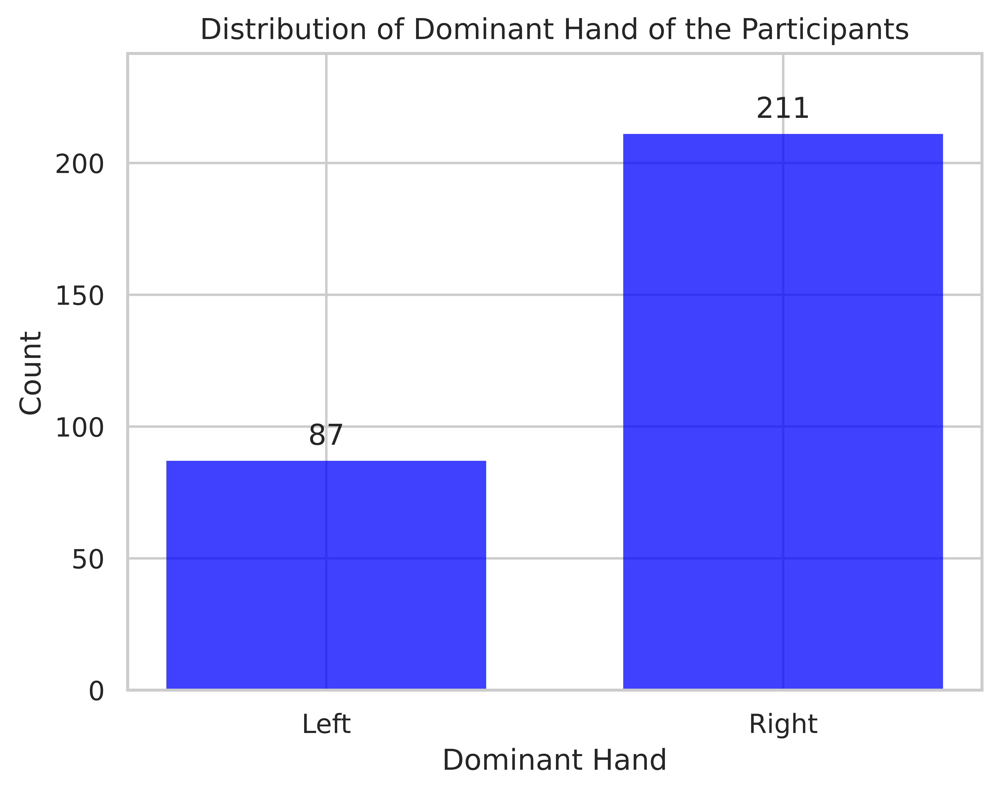

In [ ]:
plt.figure(dpi=1200)
combined_data = X_train.assign(Dominant_hand=np.where(X_train['Dominant_hand_Left'] > 0.5, 'Left', 'Right'))
combined_data["Parkinson's Disease status"] = pd.Series(y_train).map({1: "Parkinson", 0: "No Parkinson"})
ax = sns.histplot(data=combined_data, x='Dominant_hand', shrink=0.7, multiple='dodge', linewidth=0, bins=10, color='blue')
plt.title('Distribution of Dominant Hand of the Participants')
plt.xlabel('Dominant Hand')
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

x1,x2,y1,y2 = plt.axis()
plt.axis((x1,x2,y1,y2 + 20))

plt.show()

## **Custom Scorer Function**

In [ ]:
import scipy.stats as stats


def calculate_confidence_interval(data, confidence=0.95):
  if np.std(data, ddof=1) == 0:
    return (np.mean(data), np.mean(data))
  return stats.t.interval(confidence=confidence, df=len(data)-1, loc=np.mean(data), scale=stats.sem(data))

In [ ]:
def calculate_metrics_from_cm(cm):
  TP = cm['TP']
  FP = cm['FP']
  TN = cm['TN']
  FN = cm['FN']

  precision = TP / (TP + FP) if (TP + FP) != 0 else 0
  recall = TP / (TP + FN) if (TP + FN) != 0 else 0 # Sensitivity is same as recall
  specificity = TN / (TN + FP) if (TN + FP) != 0 else 0

  if precision + recall == 0:
        return 0, recall, specificity, precision

  f1_score = (2 * precision * recall) / (precision + recall)

  return f1_score, recall, specificity, precision

In [ ]:
def calculate_eq_odds_diff(unpriv_cm, priv_cm):
  unpriv_TP = unpriv_cm['TP']
  unpriv_FP = unpriv_cm['FP']
  unpriv_TN = unpriv_cm['TN']
  unpriv_FN = unpriv_cm['FN']

  priv_TP = priv_cm['TP']
  priv_FP = priv_cm['FP']
  priv_TN = priv_cm['TN']
  priv_FN = priv_cm['FN']

  unpriv_tpr = unpriv_TP / (unpriv_TP + unpriv_FN) if (unpriv_TP + unpriv_FN) != 0 else 0
  unpriv_fpr = unpriv_FP / (unpriv_FP + unpriv_TN) if (unpriv_FP + unpriv_TN) != 0 else 0

  priv_tpr = priv_TP / (priv_TP + priv_FN) if (priv_TP + priv_FN) != 0 else 0
  priv_fpr = priv_FP / (priv_FP + priv_TN) if (priv_FP + priv_TN) != 0 else 0

  diff_tpr = abs(unpriv_tpr - priv_tpr)
  diff_fpr = abs(unpriv_fpr - priv_fpr)

  return max(diff_tpr, diff_fpr)

In [ ]:
from scipy import stats


def calculate_p_value(unprivileged, privileged):
  t_statistic, p_value = stats.ttest_ind(unprivileged, privileged)
  return p_value

In [ ]:
from sklearn.metrics import roc_auc_score



def calculate_auc(auc_test_set, clf, protected_attribute):
  auc_score = {}
  privileged_group = auc_test_set[auc_test_set[protected_attribute] == 1]
  unprivileged_group = auc_test_set[auc_test_set[protected_attribute] == 0]

  if len(privileged_group['PD_status'].unique()) == 2:
      privileged_group_auc = roc_auc_score(privileged_group['PD_status'], privileged_group['prediction'])
  else:
      privileged_group_auc = np.nan

  if len(unprivileged_group['PD_status'].unique()) == 2:
      unprivileged_group_auc = roc_auc_score(unprivileged_group['PD_status'], unprivileged_group['prediction'])
  else:
      unprivileged_group_auc = np.nan

  return privileged_group_auc, unprivileged_group_auc

In [ ]:
from aif360.metrics import ClassificationMetric
from collections import defaultdict
import gc


def bootstrap_scorer(clf, X, y):
  unprivileged_groups = [{'Sex_protected': 0}, {'Ethnicity_protected': 0}, {'Platform_protected': 0}, {'Preferred_hand_protected': 0}]
  privileged_groups= [{'Sex_protected': 1}, {'Ethnicity_protected': 1}, {'Platform_protected': 1}, {'Preferred_hand_protected': 1}]
  f1_scores = []
  sensitivity_scores = []
  specificity_scores = []
  bias_metrics = None
  result = {}
  metrics = defaultdict(list)
  half_size = len(X) // 2


  # print("Cross Val Start")

  for _ in range(100):
    X_resampled, y_resampled = resample(X, y, replace=True)
    y_pred = clf.predict(X_resampled)

    # test_set['prediction'] = clf.predict_proba(X_resampled)[:, 1]
    # auc_score = calculate_auc(test_set, clf, ['Sex_protected', 'Ethnicity_protected', 'Platform_protected', 'Preferred_hand_protected'])

    f1_scores.append(f1_score(y_resampled, y_pred))
    sensitivity_scores.append(recall_score(y_resampled, y_pred, pos_label=1))
    specificity_scores.append(recall_score(y_resampled, y_pred, pos_label=0))

    for unprivileged, privileged in zip(unprivileged_groups, privileged_groups):
      group = list(unprivileged.keys())[0]
      test_group = X.copy()
      test_group['PD_status'] = y

      unprivileged_group = test_group[test_group[group] == 0]
      privileged_group = test_group[test_group[group] == 1]

      unprivileged_resampled = resample(unprivileged_group, replace=True, n_samples=half_size)
      privileged_resampled = resample(privileged_group, replace=True, n_samples=half_size)
      test_resampled = pd.concat([unprivileged_resampled, privileged_resampled])
      y_test_resampled = test_resampled['PD_status']
      X_test_resampled = test_resampled.drop('PD_status', axis=1)

      y_pred = clf.predict(X_test_resampled)
      pred_proba = clf.predict_proba(X_test_resampled)[:, 1]
      X_test_resampled['PD_status'] = y_test_resampled


      test_set_aif = BinaryLabelDataset(df=X_test_resampled,
                                  favorable_label=1,
                                  unfavorable_label=0,
                                  label_names=["PD_status"],
                                  protected_attribute_names=['Sex_protected', 'Ethnicity_protected', 'Platform_protected', 'Preferred_hand_protected'])

      test_pred = test_set_aif.copy()
      test_pred.labels = y_pred.reshape(-1, 1)

      X_test_resampled['prediction'] = pred_proba
      privileved_auc_score, unprivileged_auc_score = calculate_auc(X_test_resampled, clf, group)

      bias_metrics = ClassificationMetric(test_set_aif, test_pred,
                          unprivileged_groups = [unprivileged],
                          privileged_groups = [privileged])

      key = list(unprivileged.keys())[0]

      unprivileged_cm = bias_metrics.binary_confusion_matrix(privileged=False)
      privileged_cm = bias_metrics.binary_confusion_matrix(privileged=True)
      di = bias_metrics.disparate_impact()
      eq_odds = calculate_eq_odds_diff(unprivileged_cm, privileged_cm)

      unprivileged_f1, unprivileged_sensitiviy, unprivileged_specificity, unprivileged_precision = calculate_metrics_from_cm(unprivileged_cm)
      privileged_f1, privileged_sensitiviy, privileged_specificity, privileged_precision = calculate_metrics_from_cm(privileged_cm)

      eq_opp = unprivileged_sensitiviy/privileged_sensitiviy if privileged_sensitiviy != 0 else 0

      metrics[f"unprivileged_{key}_f1"].append(unprivileged_f1)
      metrics[f"unprivileged_{key}_sensitivity"].append(unprivileged_sensitiviy)
      metrics[f"unprivileged_{key}_specificity"].append(unprivileged_specificity)
      metrics[f"unprivileged_{key}_precision"].append(unprivileged_precision)
      metrics[f"unprivileged_{key}_auc"].append(unprivileged_auc_score)
      metrics[f"privileged_{key}_f1"].append(privileged_f1)
      metrics[f"privileged_{key}_sensitivity"].append(privileged_sensitiviy)
      metrics[f"privileged_{key}_specificity"].append(privileged_specificity)
      metrics[f"privileged_{key}_precision"].append(privileged_precision)
      metrics[f"privileged_{key}_auc"].append(privileved_auc_score)


      metrics[f"{key}_disparate_impact"].append(di)
      metrics[f"{key}_equalized_odds_difference"].append(eq_odds)
      metrics[f"{key}_equal_opportunity"].append(eq_opp)

    del X_resampled, y_resampled, test_group, unprivileged_group,
    privileged_group, unprivileged_resampled, privileged_resampled,
    test_resampled, y_test_resampled, X_test_resampled, y_pred, test_set_aif,
    test_pred, bias_metrics

    gc.collect()

  for unprivileged, privileged in zip(unprivileged_groups, privileged_groups):
      key = list(unprivileged.keys())[0]
      result[f"{key}_f1_p"]= calculate_p_value(np.array(metrics[f"unprivileged_{key}_f1"]), np.array(metrics[f"privileged_{key}_f1"]))

  f1_score_lower, f1_score_upper = calculate_confidence_interval(np.array(f1_scores))
  sensitivity_lower, sensitivity_upper  = calculate_confidence_interval(np.array(sensitivity_scores))
  specificity_lower, specificity_upper = calculate_confidence_interval(np.array(specificity_scores))
  f1_std = np.std(f1_scores)
  sensitivity_std = np.std(sensitivity_scores)
  specificity_std = np.std(specificity_scores)


  for key, value in metrics.items():
    result[f"{key}_mean"] = np.mean(value)
    result[f"{key}_std"] = np.std(value)
    result[f"{key}_lower"], result[f"{key}_upper"] = calculate_confidence_interval(np.array(value))

  return_values = {'f1_score_mean': np.mean(f1_scores), 'f1_score_upper': f1_score_upper, 'f1_score_lower': f1_score_lower,
                   'sensitivity_mean': np.mean(sensitivity_scores), 'sensitivity_upper': sensitivity_upper, 'sensitivity_lower': sensitivity_lower,
                   'specificity_mean': np.mean(specificity_scores), 'specificity_upper': specificity_upper, 'specificity_lower': specificity_lower,
                   'f1_score_std': f1_std, 'sensitivity_std': sensitivity_std, 'specificity_std': specificity_std}

  return_values.update(result)

  return return_values

pip install 'aif360[Reductions]'
pip install 'aif360[Reductions]'
pip install 'aif360[inFairness]'
pip install 'aif360[Reductions]'


In [ ]:
from IPython.display import Markdown


def print_cv_results_std(result, title):
  display(Markdown(f"# **{title} (Mean of 5-fold Cross Validation with 1000 Bootstrap Sampling at Each Fold)**"))
  display(Markdown("## **Model Performance**"))
  print(f"F1 Score: {result['test_f1_score_mean'].mean():.2f} ({np.std(result['test_f1_score_mean']):.2f})")
  print(f"Sensitivity: {result['test_sensitivity_mean'].mean():.2f} ({np.std(result['test_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_specificity_mean'].mean():.2f} ({np.std(result['test_specificity_mean']):.2f})")


  display(Markdown("## **Fairness Metrics**"))

  p_value = calculate_p_value(result['test_unprivileged_Sex_protected_f1_mean'], result['test_privileged_Sex_protected_f1_mean'])
  p_decision = "Significant" if p_value < 0.05 else "Not Significant"
  display(Markdown("###**Gender**"))
  print(f"Disparate Impact: {np.mean(result['test_Sex_protected_disparate_impact_mean']):.2f} ({np.std(result['test_Sex_protected_disparate_impact_mean']):.2f})")
  print(f"Equal Opportunity: {np.mean(result['test_Sex_protected_equal_opportunity_mean']):.2f} ({np.std(result['test_Sex_protected_equal_opportunity_mean']):.2f})")
  print(f"Equalied Odds Difference: {np.mean(result['test_Sex_protected_equalized_odds_difference_mean']):.2f} ({np.std(result['test_Sex_protected_equalized_odds_difference_mean']):.2f})")
  print(f"Significant Difference: {p_decision}")


  display(Markdown("**Female**"))
  print(f"F1 Score: {result['test_unprivileged_Sex_protected_f1_mean'].mean():.2f} ({np.std(result['test_unprivileged_Sex_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_unprivileged_Sex_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Sex_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_unprivileged_Sex_protected_specificity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Sex_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_unprivileged_Sex_protected_precision_mean'].mean():.2f} ({np.std(result['test_unprivileged_Sex_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_unprivileged_Sex_protected_auc_mean']):.2f} ({np.nanstd(result['test_unprivileged_Sex_protected_auc_mean']):.2f})")
  display(Markdown("**Male**"))
  print(f"F1 Score: {result['test_privileged_Sex_protected_f1_mean'].mean():.2f} ({np.std(result['test_privileged_Sex_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_privileged_Sex_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_privileged_Sex_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_privileged_Sex_protected_specificity_mean'].mean():.2f} ({np.std(result['test_privileged_Sex_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_privileged_Sex_protected_precision_mean'].mean():.2f} ({np.std(result['test_privileged_Sex_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_privileged_Sex_protected_auc_mean']):.2f} ({np.nanstd(result['test_privileged_Sex_protected_auc_mean']):.2f})")


  print("")

  p_value = calculate_p_value(result['test_unprivileged_Ethnicity_protected_f1_mean'], result['test_privileged_Ethnicity_protected_f1_mean'])
  p_decision = "Significant" if p_value < 0.05 else "Not Significant"

  display(Markdown("###**Race**"))
  print(f"Disparate Impact: {np.mean(result['test_Ethnicity_protected_disparate_impact_mean']):.2f} ({np.std(result['test_Ethnicity_protected_disparate_impact_mean']):.2f})")
  print(f"Equal Opportunity: {np.mean(result['test_Ethnicity_protected_equal_opportunity_mean']):.2f} ({np.std(result['test_Ethnicity_protected_equal_opportunity_mean']):.2f})")
  print(f"Equalied Odds Difference: {np.mean(result['test_Ethnicity_protected_equalized_odds_difference_mean']):.2f} ({np.std(result['test_Ethnicity_protected_equalized_odds_difference_mean']):.2f})")

  print(f"Significant Difference: {p_decision}")

  display(Markdown("**Non-White**"))
  print(f"F1 Score: {result['test_unprivileged_Ethnicity_protected_f1_mean'].mean():.2f} ({np.std(result['test_unprivileged_Ethnicity_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_unprivileged_Ethnicity_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Ethnicity_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_unprivileged_Ethnicity_protected_specificity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Ethnicity_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_unprivileged_Ethnicity_protected_precision_mean'].mean():.2f} ({np.std(result['test_unprivileged_Ethnicity_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_unprivileged_Ethnicity_protected_auc_mean']):.2f} ({np.nanstd(result['test_unprivileged_Ethnicity_protected_auc_mean']):.2f})")


  display(Markdown("**White**"))
  print(f"F1 Score: {result['test_privileged_Ethnicity_protected_f1_mean'].mean():.2f} ({np.std(result['test_privileged_Ethnicity_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_privileged_Ethnicity_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_privileged_Ethnicity_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_privileged_Ethnicity_protected_specificity_mean'].mean():.2f} ({np.std(result['test_privileged_Ethnicity_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_privileged_Ethnicity_protected_precision_mean'].mean():.2f} ({np.std(result['test_privileged_Ethnicity_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_privileged_Ethnicity_protected_auc_mean']):.2f} ({np.nanstd(result['test_privileged_Ethnicity_protected_auc_mean']):.2f})")


  print("")
  p_value = calculate_p_value(result['test_unprivileged_Platform_protected_f1_mean'], result['test_privileged_Platform_protected_f1_mean'])
  p_decision = "Significant" if p_value < 0.05 else "Not Significant"


  display(Markdown("###**Device**"))
  print(f"Disparate Impact: {np.mean(result['test_Platform_protected_disparate_impact_mean']):.2f} ({np.std(result['test_Platform_protected_disparate_impact_mean']):.2f})")
  print(f"Equal Opportunity: {np.mean(result['test_Platform_protected_equal_opportunity_mean']):.2f} ({np.std(result['test_Platform_protected_equal_opportunity_mean']):.2f})")
  print(f"Equalied Odds Difference: {np.mean(result['test_Platform_protected_equalized_odds_difference_mean']):.2f} ({np.std(result['test_Platform_protected_equalized_odds_difference_mean']):.2f})")
  print(f"Significant Difference: {p_decision}")

  display(Markdown("**Windows**"))
  print(f"F1 Score: {result['test_unprivileged_Platform_protected_f1_mean'].mean():.2f} ({np.std(result['test_unprivileged_Platform_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_unprivileged_Platform_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Platform_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_unprivileged_Platform_protected_specificity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Platform_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_unprivileged_Platform_protected_precision_mean'].mean():.2f} ({np.std(result['test_unprivileged_Platform_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_unprivileged_Platform_protected_auc_mean']):.2f} ({np.nanstd(result['test_unprivileged_Platform_protected_auc_mean']):.2f})")


  display(Markdown("**Mac**"))
  print(f"F1 Score: {result['test_privileged_Platform_protected_f1_mean'].mean():.2f} ({np.std(result['test_privileged_Platform_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_privileged_Platform_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_privileged_Platform_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_privileged_Platform_protected_specificity_mean'].mean():.2f} ({np.std(result['test_privileged_Platform_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_privileged_Platform_protected_precision_mean'].mean():.2f} ({np.std(result['test_privileged_Platform_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_privileged_Platform_protected_auc_mean']):.2f} ({np.nanstd(result['test_privileged_Platform_protected_auc_mean']):.2f})")


  print("")
  p_value = calculate_p_value(result['test_unprivileged_Preferred_hand_protected_f1_mean'], result['test_privileged_Preferred_hand_protected_f1_mean'])
  p_decision = "Significant" if p_value < 0.05 else "Not Significant"


  display(Markdown("###**Dominant Hand**"))
  print(f"Disparate Impact: {np.mean(result['test_Preferred_hand_protected_disparate_impact_mean']):.2f} ({np.std(result['test_Preferred_hand_protected_disparate_impact_mean']):.2f})")
  print(f"Equal Opportunity: {np.mean(result['test_Preferred_hand_protected_equal_opportunity_mean']):.2f} ({np.std(result['test_Preferred_hand_protected_equal_opportunity_mean']):.2f})")
  print(f"Equalied Odds Difference: {np.mean(result['test_Preferred_hand_protected_equalized_odds_difference_mean']):.2f} ({np.std(result['test_Preferred_hand_protected_equalized_odds_difference_mean']):.2f})")
  print(f"Significant Difference: {p_decision}")

  display(Markdown("**Left**"))
  print(f"F1 Score: {result['test_unprivileged_Preferred_hand_protected_f1_mean'].mean():.2f} ({np.std(result['test_unprivileged_Preferred_hand_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_unprivileged_Preferred_hand_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Preferred_hand_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_unprivileged_Preferred_hand_protected_specificity_mean'].mean():.2f} ({np.std(result['test_unprivileged_Preferred_hand_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_unprivileged_Preferred_hand_protected_precision_mean'].mean():.2f} ({np.std(result['test_unprivileged_Preferred_hand_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_unprivileged_Preferred_hand_protected_auc_mean']):.2f} ({np.nanstd(result['test_unprivileged_Preferred_hand_protected_auc_mean']):.2f})")


  display(Markdown("**Right**"))
  print(f"F1 Score: {result['test_privileged_Preferred_hand_protected_f1_mean'].mean():.2f} ({np.std(result['test_privileged_Preferred_hand_protected_f1_mean']):.2f})")
  print(f"Sensitivity: {result['test_privileged_Preferred_hand_protected_sensitivity_mean'].mean():.2f} ({np.std(result['test_privileged_Preferred_hand_protected_sensitivity_mean']):.2f})")
  print(f"Specificity: {result['test_privileged_Preferred_hand_protected_specificity_mean'].mean():.2f} ({np.std(result['test_privileged_Preferred_hand_protected_specificity_mean']):.2f})")
  print(f"Precision: {result['test_privileged_Preferred_hand_protected_precision_mean'].mean():.2f} ({np.std(result['test_privileged_Preferred_hand_protected_precision_mean']):.2f})")
  print(f"AUC: {np.nanmean(result['test_privileged_Preferred_hand_protected_auc_mean']):.2f} ({np.nanstd(result['test_privileged_Preferred_hand_protected_auc_mean']):.2f})")

### **Evaluating Model Bias**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate


lgc = LogisticRegression(solver='liblinear', C=10, penalty='l2')
lgc_cv_result = cross_validate(lgc, X_train, y_train, cv=5, scoring=bootstrap_scorer)

In [ ]:
print_cv_results_std(lgc_cv_result, "Logistic Regression")

# **Logistic Regression (Mean of 5-fold Cross Validation with 1000 Bootstrap Sampling at Each Fold)**

## **Model Performance**

F1 Score: 0.87 (0.03)
Sensitivity: 0.87 (0.10)
Specificity: 0.87 (0.08)


## **Fairness Metrics**

###**Gender**

Disparate Impact: 1.42 (0.48)
Equal Opportunity: 1.03 (0.14)
Equalied Odds Difference: 0.34 (0.19)
Significant Difference: Not Significant


**Female**

F1 Score: 0.80 (0.18)
Sensitivity: 0.90 (0.13)
Specificity: 0.67 (0.31)
Precision: 0.80 (0.25)
AUC: 0.76 (0.19)


**Male**

F1 Score: 0.87 (0.03)
Sensitivity: 0.88 (0.10)
Specificity: 0.89 (0.06)
Precision: 0.87 (0.07)
AUC: 0.93 (0.04)



###**Race**

Disparate Impact: 3.55 (0.76)
Equal Opportunity: 1.41 (0.25)
Equalied Odds Difference: 0.57 (0.28)
Significant Difference: Significant


**Non-White**

F1 Score: 0.92 (0.06)
Sensitivity: 0.97 (0.03)
Specificity: 0.27 (0.39)
Precision: 0.89 (0.11)
AUC: 0.88 (0.09)


**White**

F1 Score: 0.71 (0.14)
Sensitivity: 0.74 (0.12)
Specificity: 0.92 (0.07)
Precision: 0.77 (0.23)
AUC: 0.92 (0.02)



###**Device**

Disparate Impact: 0.39 (0.09)
Equal Opportunity: 0.81 (0.13)
Equalied Odds Difference: 0.52 (0.22)
Significant Difference: Significant


**Windows**

F1 Score: 0.80 (0.05)
Sensitivity: 0.81 (0.13)
Specificity: 0.89 (0.08)
Precision: 0.84 (0.10)
AUC: 0.90 (0.03)


**Mac**

F1 Score: 0.95 (0.05)
Sensitivity: 1.00 (0.00)
Specificity: 0.16 (0.20)
Precision: 0.91 (0.09)
AUC: 0.72 (0.20)



###**Dominant Hand**

Disparate Impact: 0.42 (0.18)
Equal Opportunity: 1.01 (0.05)
Equalied Odds Difference: 0.24 (0.03)
Significant Difference: Not Significant


**Left**

F1 Score: 0.88 (0.06)
Sensitivity: 0.88 (0.09)
Specificity: 0.98 (0.03)
Precision: 0.92 (0.13)
AUC: 0.92 (0.04)


**Right**

F1 Score: 0.85 (0.02)
Sensitivity: 0.88 (0.10)
Specificity: 0.80 (0.12)
Precision: 0.85 (0.08)
AUC: 0.90 (0.03)


In [ ]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features='log2', min_samples_leaf=1, min_samples_split=6, class_weight='balanced', random_state=67)
dtc_cv_results = cross_validate(dtc, X_train, y_train, cv=5, return_estimator=True, return_train_score=True, scoring=bootstrap_scorer)

In [ ]:
print_cv_results_std(dtc_cv_results, "Decision Tree")

# **Decision Tree (Mean of 5-fold Cross Validation with 1000 Bootstrap Sampling at Each Fold)**

## **Model Performance**

F1 Score: 0.79 (0.06)
Sensitivity: 0.79 (0.11)
Specificity: 0.80 (0.06)


## **Fairness Metrics**

###**Gender**

Disparate Impact: 1.39 (0.68)
Equal Opportunity: 0.91 (0.32)
Equalied Odds Difference: 0.46 (0.13)
Significant Difference: Not Significant


**Female**

F1 Score: 0.67 (0.22)
Sensitivity: 0.76 (0.27)
Specificity: 0.55 (0.28)
Precision: 0.69 (0.24)
AUC: 0.74 (0.12)


**Male**

F1 Score: 0.82 (0.07)
Sensitivity: 0.84 (0.12)
Specificity: 0.84 (0.06)
Precision: 0.82 (0.05)
AUC: 0.85 (0.07)



###**Race**

Disparate Impact: 2.29 (0.51)
Equal Opportunity: 1.09 (0.19)
Equalied Odds Difference: 0.24 (0.06)
Significant Difference: Significant


**Non-White**

F1 Score: 0.86 (0.06)
Sensitivity: 0.82 (0.07)
Specificity: 0.56 (0.33)
Precision: 0.91 (0.09)
AUC: 0.70 (0.06)


**White**

F1 Score: 0.68 (0.10)
Sensitivity: 0.80 (0.15)
Specificity: 0.82 (0.05)
Precision: 0.64 (0.14)
AUC: 0.83 (0.08)



###**Device**

Disparate Impact: 0.73 (0.39)
Equal Opportunity: 1.31 (0.83)
Equalied Odds Difference: 0.33 (0.13)
Significant Difference: Not Significant


**Windows**

F1 Score: 0.75 (0.04)
Sensitivity: 0.81 (0.12)
Specificity: 0.80 (0.07)
Precision: 0.72 (0.05)
AUC: 0.85 (0.03)


**Mac**

F1 Score: 0.83 (0.19)
Sensitivity: 0.79 (0.26)
Specificity: 0.43 (0.39)
Precision: 0.96 (0.05)
AUC: 0.78 (0.05)



###**Dominant Hand**

Disparate Impact: 0.54 (0.20)
Equal Opportunity: 0.92 (0.22)
Equalied Odds Difference: 0.27 (0.07)
Significant Difference: Not Significant


**Left**

F1 Score: 0.64 (0.18)
Sensitivity: 0.73 (0.20)
Specificity: 0.85 (0.12)
Precision: 0.66 (0.24)
AUC: 0.77 (0.09)


**Right**

F1 Score: 0.80 (0.05)
Sensitivity: 0.81 (0.10)
Specificity: 0.78 (0.08)
Precision: 0.82 (0.05)
AUC: 0.82 (0.03)


In [ ]:
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV


sv_c = LinearSVC(C=1, penalty='l1', dual=False, max_iter=10000)
sv_c = CalibratedClassifierCV(sv_c)
svc_cv_results = cross_validate(sv_c, X_train, y_train, cv=5, return_estimator=True, return_train_score=True, scoring=bootstrap_scorer)

In [ ]:
print_cv_results_std(svc_cv_results, "LinearSVC")

# **LinearSVC (Mean of 5-fold Cross Validation with 1000 Bootstrap Sampling at Each Fold)**

## **Model Performance**

F1 Score: 0.86 (0.04)
Sensitivity: 0.86 (0.10)
Specificity: 0.87 (0.05)


## **Fairness Metrics**

###**Gender**

Disparate Impact: 1.21 (0.45)
Equal Opportunity: 0.96 (0.20)
Equalied Odds Difference: 0.29 (0.12)
Significant Difference: Not Significant


**Female**

F1 Score: 0.80 (0.18)
Sensitivity: 0.85 (0.20)
Specificity: 0.81 (0.25)
Precision: 0.84 (0.24)
AUC: 0.78 (0.24)


**Male**

F1 Score: 0.87 (0.03)
Sensitivity: 0.89 (0.09)
Specificity: 0.89 (0.05)
Precision: 0.87 (0.05)
AUC: 0.93 (0.04)



###**Race**

Disparate Impact: 3.83 (1.45)
Equal Opportunity: 1.46 (0.33)
Equalied Odds Difference: 0.57 (0.29)
Significant Difference: Significant


**Non-White**

F1 Score: 0.93 (0.05)
Sensitivity: 0.97 (0.03)
Specificity: 0.29 (0.40)
Precision: 0.90 (0.09)
AUC: 0.87 (0.12)


**White**

F1 Score: 0.73 (0.09)
Sensitivity: 0.75 (0.12)
Specificity: 0.92 (0.04)
Precision: 0.77 (0.14)
AUC: 0.91 (0.01)



###**Device**

Disparate Impact: 0.38 (0.06)
Equal Opportunity: 0.81 (0.11)
Equalied Odds Difference: 0.49 (0.26)
Significant Difference: Significant


**Windows**

F1 Score: 0.81 (0.06)
Sensitivity: 0.80 (0.13)
Specificity: 0.91 (0.04)
Precision: 0.85 (0.05)
AUC: 0.90 (0.04)


**Mac**

F1 Score: 0.94 (0.04)
Sensitivity: 0.98 (0.04)
Specificity: 0.15 (0.20)
Precision: 0.91 (0.08)
AUC: 0.51 (0.00)



###**Dominant Hand**

Disparate Impact: 0.48 (0.21)
Equal Opportunity: 1.00 (0.05)
Equalied Odds Difference: 0.21 (0.04)
Significant Difference: Not Significant


**Left**

F1 Score: 0.86 (0.07)
Sensitivity: 0.86 (0.10)
Specificity: 0.97 (0.04)
Precision: 0.88 (0.12)
AUC: 0.93 (0.03)


**Right**

F1 Score: 0.86 (0.03)
Sensitivity: 0.88 (0.10)
Specificity: 0.84 (0.08)
Precision: 0.87 (0.07)
AUC: 0.90 (0.03)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(max_depth= 5, max_features = 'log2', min_samples_leaf= 1, min_samples_split= 5, n_estimators=100, class_weight='balanced')

rfc_cv_results = cross_validate(rfc, X_train, y_train, cv=5, return_estimator=True, return_train_score=True, scoring=bootstrap_scorer)

In [ ]:
print_cv_results_std(rfc_cv_results, "Random Forest")

# **Random Forest (Mean of 5-fold Cross Validation with 1000 Bootstrap Sampling at Each Fold)**

## **Model Performance**

F1 Score: 0.92 (0.03)
Sensitivity: 0.95 (0.04)
Specificity: 0.89 (0.07)


## **Fairness Metrics**

###**Gender**

Disparate Impact: 1.51 (0.39)
Equal Opportunity: 1.03 (0.08)
Equalied Odds Difference: 0.34 (0.14)
Significant Difference: Not Significant


**Female**

F1 Score: 0.83 (0.15)
Sensitivity: 0.97 (0.06)
Specificity: 0.62 (0.21)
Precision: 0.76 (0.21)
AUC: 0.94 (0.08)


**Male**

F1 Score: 0.93 (0.03)
Sensitivity: 0.95 (0.05)
Specificity: 0.92 (0.05)
Precision: 0.91 (0.06)
AUC: 0.97 (0.03)



###**Race**

Disparate Impact: 2.98 (0.87)
Equal Opportunity: 1.06 (0.07)
Equalied Odds Difference: 0.34 (0.29)
Significant Difference: Not Significant


**Non-White**

F1 Score: 0.94 (0.04)
Sensitivity: 0.98 (0.03)
Specificity: 0.44 (0.39)
Precision: 0.91 (0.09)
AUC: 0.86 (0.11)


**White**

F1 Score: 0.84 (0.11)
Sensitivity: 0.93 (0.04)
Specificity: 0.92 (0.06)
Precision: 0.80 (0.18)
AUC: 0.97 (0.02)



###**Device**

Disparate Impact: 0.45 (0.05)
Equal Opportunity: 0.91 (0.06)
Equalied Odds Difference: 0.26 (0.12)
Significant Difference: Significant


**Windows**

F1 Score: 0.87 (0.04)
Sensitivity: 0.91 (0.06)
Specificity: 0.89 (0.08)
Precision: 0.86 (0.08)
AUC: 0.97 (0.04)


**Mac**

F1 Score: 0.98 (0.03)
Sensitivity: 1.00 (0.00)
Specificity: 0.43 (0.39)
Precision: 0.96 (0.05)
AUC: 0.83 (0.09)



###**Dominant Hand**

Disparate Impact: 0.49 (0.22)
Equal Opportunity: 0.98 (0.09)
Equalied Odds Difference: 0.17 (0.04)
Significant Difference: Not Significant


**Left**

F1 Score: 0.86 (0.14)
Sensitivity: 0.92 (0.08)
Specificity: 0.95 (0.07)
Precision: 0.84 (0.20)
AUC: 0.97 (0.03)


**Right**

F1 Score: 0.91 (0.02)
Sensitivity: 0.94 (0.03)
Specificity: 0.85 (0.09)
Precision: 0.89 (0.05)
AUC: 0.97 (0.03)


In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBClassifier


xgb = XGBClassifier(n_estimators=200, objective='binary:logistic', gamma= 0.2, learning_rate= 0.01, max_depth=3, min_child_weight=1, reg_alpha=0, reg_lambda=0.1)
xgb_cv_results = cross_validate(xgb, X_train, y_train, cv=5, return_estimator=True, return_train_score=True, scoring=bootstrap_scorer)

In [ ]:
print_cv_results_std(xgb_cv_results, "XGBoost")

# **XGBoost (Mean of 5-fold Cross Validation with 1000 Bootstrap Sampling at Each Fold)**

## **Model Performance**

F1 Score: 0.83 (0.08)
Sensitivity: 0.93 (0.05)
Specificity: 0.68 (0.30)


## **Fairness Metrics**

###**Gender**

Disparate Impact: 1.37 (0.48)
Equal Opportunity: 1.06 (0.09)
Equalied Odds Difference: 0.34 (0.13)
Significant Difference: Not Significant


**Female**

F1 Score: 0.79 (0.13)
Sensitivity: 0.97 (0.06)
Specificity: 0.58 (0.13)
Precision: 0.69 (0.18)
AUC: 0.90 (0.09)


**Male**

F1 Score: 0.82 (0.12)
Sensitivity: 0.93 (0.07)
Specificity: 0.69 (0.35)
Precision: 0.77 (0.20)
AUC: 0.96 (0.03)



###**Race**

Disparate Impact: 1.93 (0.68)
Equal Opportunity: 0.95 (0.09)
Equalied Odds Difference: 0.47 (0.29)
Significant Difference: Not Significant


**Non-White**

F1 Score: 0.89 (0.09)
Sensitivity: 0.90 (0.06)
Specificity: 0.46 (0.44)
Precision: 0.90 (0.13)
AUC: 0.91 (0.05)


**White**

F1 Score: 0.71 (0.23)
Sensitivity: 0.94 (0.07)
Specificity: 0.71 (0.31)
Precision: 0.65 (0.30)
AUC: 0.95 (0.02)



###**Device**

Disparate Impact: 0.58 (0.18)
Equal Opportunity: 0.93 (0.07)
Equalied Odds Difference: 0.23 (0.11)
Significant Difference: Significant


**Windows**

F1 Score: 0.77 (0.12)
Sensitivity: 0.92 (0.08)
Specificity: 0.69 (0.30)
Precision: 0.71 (0.20)
AUC: 0.94 (0.02)


**Mac**

F1 Score: 0.96 (0.05)
Sensitivity: 0.99 (0.03)
Specificity: 0.33 (0.42)
Precision: 0.94 (0.08)
AUC: 0.97 (0.03)



###**Dominant Hand**

Disparate Impact: 0.73 (0.18)
Equal Opportunity: 1.02 (0.15)
Equalied Odds Difference: 0.19 (0.06)
Significant Difference: Not Significant


**Left**

F1 Score: 0.67 (0.32)
Sensitivity: 0.92 (0.10)
Specificity: 0.72 (0.35)
Precision: 0.64 (0.38)
AUC: 0.96 (0.03)


**Right**

F1 Score: 0.84 (0.07)
Sensitivity: 0.92 (0.06)
Specificity: 0.67 (0.27)
Precision: 0.80 (0.13)
AUC: 0.93 (0.04)


In [ ]:
!pip install lightgbm

In [ ]:
from lightgbm import LGBMClassifier


bst = LGBMClassifier(class_weight='balanced')
bst_cv_results = cross_validate(bst, X_train, y_train, cv=5, return_estimator=True, return_train_score=True, scoring=bootstrap_scorer)

In [ ]:
print_cv_results_std(bst_cv_results, "LightGBM")

# **LightGBM (Mean of 5-fold Cross Validation with 1000 Bootstrap Sampling at Each Fold)**

## **Model Performance**

F1 Score: 0.88 (0.03)
Sensitivity: 0.90 (0.06)
Specificity: 0.86 (0.07)


## **Fairness Metrics**

###**Gender**

Disparate Impact: 1.35 (0.42)
Equal Opportunity: 1.04 (0.09)
Equalied Odds Difference: 0.27 (0.08)
Significant Difference: Not Significant


**Female**

F1 Score: 0.85 (0.11)
Sensitivity: 0.93 (0.08)
Specificity: 0.71 (0.17)
Precision: 0.80 (0.16)
AUC: 0.92 (0.08)


**Male**

F1 Score: 0.88 (0.04)
Sensitivity: 0.91 (0.08)
Specificity: 0.88 (0.08)
Precision: 0.87 (0.08)
AUC: 0.96 (0.05)



###**Race**

Disparate Impact: 2.80 (0.48)
Equal Opportunity: 1.10 (0.14)
Equalied Odds Difference: 0.40 (0.29)
Significant Difference: Not Significant


**Non-White**

F1 Score: 0.91 (0.06)
Sensitivity: 0.95 (0.05)
Specificity: 0.41 (0.40)
Precision: 0.90 (0.11)
AUC: 0.94 (0.04)


**White**

F1 Score: 0.79 (0.11)
Sensitivity: 0.88 (0.07)
Specificity: 0.91 (0.07)
Precision: 0.78 (0.20)
AUC: 0.94 (0.04)



###**Device**

Disparate Impact: 0.47 (0.03)
Equal Opportunity: 0.91 (0.07)
Equalied Odds Difference: 0.24 (0.08)
Significant Difference: Significant


**Windows**

F1 Score: 0.83 (0.03)
Sensitivity: 0.87 (0.08)
Specificity: 0.87 (0.07)
Precision: 0.82 (0.08)
AUC: 0.94 (0.04)


**Mac**

F1 Score: 0.96 (0.03)
Sensitivity: 0.96 (0.05)
Specificity: 0.44 (0.39)
Precision: 0.96 (0.05)
AUC: 0.92 (0.11)



###**Dominant Hand**

Disparate Impact: 0.55 (0.16)
Equal Opportunity: 0.98 (0.10)
Equalied Odds Difference: 0.19 (0.05)
Significant Difference: Not Significant


**Left**

F1 Score: 0.74 (0.17)
Sensitivity: 0.88 (0.10)
Specificity: 0.90 (0.10)
Precision: 0.70 (0.25)
AUC: 0.95 (0.04)


**Right**

F1 Score: 0.88 (0.03)
Sensitivity: 0.90 (0.03)
Specificity: 0.84 (0.09)
Precision: 0.88 (0.06)
AUC: 0.93 (0.04)


In [10]:
gender_group_bar = pd.DataFrame({
    'Algorithms': [
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
    ],
    'Gender': [
        'Male', 'Male', 'Male', 'Male', 'Male', 'Male',
        'Female', 'Female', 'Female', 'Female', 'Female', 'Female'
    ],
    'F1': [
        np.mean(lgc_cv_result['test_privileged_Sex_protected_f1_mean']), np.mean(dtc_cv_results['test_privileged_Sex_protected_f1_mean']), np.mean(svc_cv_results['test_privileged_Sex_protected_f1_mean']), np.mean(rfc_cv_results['test_privileged_Sex_protected_f1_mean']), np.mean(xgb_cv_results['test_privileged_Sex_protected_f1_mean']), np.mean(bst_cv_results['test_privileged_Sex_protected_f1_mean']),
        np.mean(lgc_cv_result['test_unprivileged_Sex_protected_f1_mean']), np.mean(dtc_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.mean(svc_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.mean(rfc_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.mean(xgb_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.mean(bst_cv_results['test_unprivileged_Sex_protected_f1_mean'])
    ],
    'std': [
        np.std(lgc_cv_result['test_privileged_Sex_protected_f1_mean']), np.std(dtc_cv_results['test_privileged_Sex_protected_f1_mean']), np.std(svc_cv_results['test_privileged_Sex_protected_f1_mean']), np.std(rfc_cv_results['test_privileged_Sex_protected_f1_mean']), np.std(xgb_cv_results['test_privileged_Sex_protected_f1_mean']), np.std(bst_cv_results['test_privileged_Sex_protected_f1_mean']),
        np.std(lgc_cv_result['test_unprivileged_Sex_protected_f1_mean']), np.std(dtc_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.std(svc_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.std(rfc_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.std(xgb_cv_results['test_unprivileged_Sex_protected_f1_mean']), np.std(bst_cv_results['test_unprivileged_Sex_protected_f1_mean'])
    ]
})

gender_group_bar['yerr_lower'] = gender_group_bar['F1'] - gender_group_bar['std']
gender_group_bar['yerr_upper'] = gender_group_bar['F1'] + gender_group_bar['std']

male_data = gender_group_bar[gender_group_bar['Gender'] == 'Male']
female_data = gender_group_bar[gender_group_bar['Gender'] == 'Female']

fig, ax = plt.subplots(figsize=(15, 6), dpi=1200)
bar_width = 0.35

r1 = np.arange(len(male_data))
r2 = [x + bar_width for x in r1]

bars1 = ax.bar(r1, male_data['F1'], width=bar_width, label='Male',
       yerr=male_data['std'], capsize=5, color='cornflowerblue')

bars2 = ax.bar(r2, female_data['F1'], width=bar_width, label='Female',
       yerr=female_data['std'], capsize=5, color='tomato')

ax.set_xlabel('Algorithms', fontweight='bold')
ax.set_ylabel('F1-Score', fontweight='bold')
ax.set_title('Differences in F1-Scores by Sex')
ax.set_xticks([r + bar_width / 2 for r in range(len(male_data))])
ax.set_xticklabels(male_data['Algorithms'])

def add_values(bars, data):
    for bar, (_, row) in zip(bars, data.iterrows()):
        yval = bar.get_height()
        err = row['std']
        ax.text(bar.get_x() + bar.get_width() / 2.0,
                yval + err + 0.02,
                f"{round(yval, 2)}", ha='center', va='bottom', fontsize=10)

add_values(bars1, male_data)
add_values(bars2, female_data)
max_y = max((male_data['F1'] + male_data['std']).max(),
            (female_data['F1'] + female_data['std']).max())
ax.set_ylim(0, max_y + 0.1)
ax.legend()
plt.show()

In [9]:
race_group_bar = pd.DataFrame({
    'Algorithms': [
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
    ],
    'Race': [
        'White', 'White', 'White', 'White', 'White', 'White',
        'Non-White', 'Non-White', 'Non-White', 'Non-White', 'Non-White', 'Non-White'
    ],
    'F1': [
        np.mean(lgc_cv_result['test_privileged_Ethnicity_protected_f1_mean']), np.mean(dtc_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.mean(svc_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.mean(rfc_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.mean(xgb_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.mean(bst_cv_results['test_privileged_Ethnicity_protected_f1_mean']),
        np.mean(lgc_cv_result['test_unprivileged_Ethnicity_protected_f1_mean']), np.mean(dtc_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.mean(svc_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.mean(rfc_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.mean(xgb_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.mean(bst_cv_results['test_unprivileged_Ethnicity_protected_f1_mean'])
    ],
    'std': [
        np.std(lgc_cv_result['test_privileged_Ethnicity_protected_f1_mean']), np.std(dtc_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.std(svc_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.std(rfc_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.std(xgb_cv_results['test_privileged_Ethnicity_protected_f1_mean']), np.std(bst_cv_results['test_privileged_Ethnicity_protected_f1_mean']),
        np.std(lgc_cv_result['test_unprivileged_Ethnicity_protected_f1_mean']), np.std(dtc_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.std(svc_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.std(rfc_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.std(xgb_cv_results['test_unprivileged_Ethnicity_protected_f1_mean']), np.std(bst_cv_results['test_unprivileged_Ethnicity_protected_f1_mean'])
    ]
})

race_group_bar['yerr_lower'] = race_group_bar['F1'] - race_group_bar['std']
race_group_bar['yerr_upper'] = race_group_bar['F1'] + race_group_bar['std']

white_data = race_group_bar[race_group_bar['Race'] == 'White']
non_white_data = race_group_bar[race_group_bar['Race'] == 'Non-White']

fig, ax = plt.subplots(figsize=(15, 6), dpi=1200)
bar_width = 0.35

r1 = np.arange(len(white_data))
r2 = [x + bar_width for x in r1]

bars1 = ax.bar(r1, white_data['F1'], width=bar_width, label='White',
       yerr=white_data['std'], capsize=5, color='cornflowerblue')

bars2 = ax.bar(r2, non_white_data['F1'], width=bar_width, label='Non-White',
       yerr=non_white_data['std'], capsize=5, color='tomato')

ax.set_xlabel('Algorithms', fontweight='bold')
ax.set_ylabel('F1-Score', fontweight='bold')
ax.set_title('Differences in F1-Scores by Race')
ax.set_xticks([r + bar_width / 2 for r in range(len(white_data))])
ax.set_xticklabels(white_data['Algorithms'])

def add_values(bars, data):
    for bar, (_, row) in zip(bars, data.iterrows()):
        yval = bar.get_height()
        err = row['std']
        ax.text(bar.get_x() + bar.get_width() / 2.0,
                yval + err + 0.02,
                f"{round(yval, 2)}", ha='center', va='bottom', fontsize=10)

add_values(bars1, white_data)
add_values(bars2, non_white_data)
max_y = max((white_data['F1'] + white_data['std']).max(),
            (non_white_data['F1'] + non_white_data['std']).max())
ax.set_ylim(0, max_y + 0.1)
ax.legend()
plt.show()

In [6]:
device_group_bar = pd.DataFrame({
    'Algorithms': [
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
    ],
    'Device': [
        'Mac', 'Mac', 'Mac', 'Mac', 'Mac', 'Mac',
        'Windows', 'Windows', 'Windows', 'Windows', 'Windows', 'Windows'
    ],
    'F1': [
        np.mean(lgc_cv_result['test_privileged_Platform_protected_f1_mean']), np.mean(dtc_cv_results['test_privileged_Platform_protected_f1_mean']), np.mean(svc_cv_results['test_privileged_Platform_protected_f1_mean']), np.mean(rfc_cv_results['test_privileged_Platform_protected_f1_mean']), np.mean(xgb_cv_results['test_privileged_Platform_protected_f1_mean']), np.mean(bst_cv_results['test_privileged_Platform_protected_f1_mean']),
        np.mean(lgc_cv_result['test_unprivileged_Platform_protected_f1_mean']), np.mean(dtc_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.mean(svc_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.mean(rfc_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.mean(xgb_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.mean(bst_cv_results['test_unprivileged_Platform_protected_f1_mean'])
    ],
    'std': [
        np.std(lgc_cv_result['test_privileged_Platform_protected_f1_mean']), np.std(dtc_cv_results['test_privileged_Platform_protected_f1_mean']), np.std(svc_cv_results['test_privileged_Platform_protected_f1_mean']), np.std(rfc_cv_results['test_privileged_Platform_protected_f1_mean']), np.std(xgb_cv_results['test_privileged_Platform_protected_f1_mean']), np.std(bst_cv_results['test_privileged_Platform_protected_f1_mean']),
        np.std(lgc_cv_result['test_unprivileged_Platform_protected_f1_mean']), np.std(dtc_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.std(svc_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.std(rfc_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.std(xgb_cv_results['test_unprivileged_Platform_protected_f1_mean']), np.std(bst_cv_results['test_unprivileged_Platform_protected_f1_mean'])
    ]
})

device_group_bar['yerr_lower'] = device_group_bar['F1'] - device_group_bar['std']
device_group_bar['yerr_upper'] = device_group_bar['F1'] + device_group_bar['std']

mac_data = device_group_bar[device_group_bar['Device'] == 'Mac']
win_data = device_group_bar[device_group_bar['Device'] == 'Windows']

fig, ax = plt.subplots(figsize=(15, 6), dpi=1200)
bar_width = 0.35

r1 = np.arange(len(mac_data))
r2 = [x + bar_width for x in r1]

bars1 = ax.bar(r1, mac_data['F1'], width=bar_width, label='Mac',
       yerr=mac_data['std'], capsize=5, color='cornflowerblue')

bars2 = ax.bar(r2, win_data['F1'], width=bar_width, label='Windows',
       yerr=win_data['std'], capsize=5, color='tomato')

ax.set_xlabel('Algorithms', fontweight='bold')
ax.set_ylabel('F1-Score', fontweight='bold')
ax.set_title('Differences in F1-Scores by Device Type')
ax.set_xticks([r + bar_width / 2 for r in range(len(mac_data))])
ax.set_xticklabels(mac_data['Algorithms'])

def add_values(bars, data):
    for bar, (_, row) in zip(bars, data.iterrows()):
        yval = bar.get_height()
        err = row['std']
        ax.text(bar.get_x() + bar.get_width() / 2.0,
                yval + err + 0.02,
                f"{round(yval, 2)}", ha='center', va='bottom', fontsize=10)

add_values(bars1, mac_data)
add_values(bars2, win_data)
max_y = max((mac_data['F1'] + mac_data['std']).max(),
            (win_data['F1'] + win_data['std']).max())
ax.set_ylim(0, max_y + 0.1)
ax.legend()
plt.show()

In [8]:
hand_group_bar = pd.DataFrame({
    'Algorithms': [
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
        'Logistic Regression', 'Decision Tree', 'Support Vector Machine', 'Random Forest', 'XGBoost', 'LightGBM',
    ],
    'Hand': [
        'Right', 'Right', 'Right', 'Right', 'Right', 'Right',
        'Left', 'Left', 'Left', 'Left', 'Left', 'Left'
    ],
    'F1': [
        np.mean(lgc_cv_result['test_privileged_Preferred_hand_protected_f1_mean']), np.mean(dtc_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.mean(svc_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.mean(rfc_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.mean(xgb_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.mean(bst_cv_results['test_privileged_Preferred_hand_protected_f1_mean']),
        np.mean(lgc_cv_result['test_unprivileged_Preferred_hand_protected_f1_mean']), np.mean(dtc_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.mean(svc_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.mean(rfc_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.mean(xgb_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.mean(bst_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean'])
    ],
    'std': [
        np.std(lgc_cv_result['test_privileged_Preferred_hand_protected_f1_mean']), np.std(dtc_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.std(svc_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.std(rfc_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.std(xgb_cv_results['test_privileged_Preferred_hand_protected_f1_mean']), np.std(bst_cv_results['test_privileged_Preferred_hand_protected_f1_mean']),
        np.std(lgc_cv_result['test_unprivileged_Preferred_hand_protected_f1_mean']), np.std(dtc_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.std(svc_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.std(rfc_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.std(xgb_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean']), np.std(bst_cv_results['test_unprivileged_Preferred_hand_protected_f1_mean'])
    ]
})

hand_group_bar['yerr_lower'] = hand_group_bar['F1'] - hand_group_bar['std']
hand_group_bar['yerr_upper'] = hand_group_bar['F1'] + hand_group_bar['std']

right_data = hand_group_bar[hand_group_bar['Hand'] == 'Right']
left_data = hand_group_bar[hand_group_bar['Hand'] == 'Left']

fig, ax = plt.subplots(figsize=(15, 6), dpi=1200)
bar_width = 0.35

r1 = np.arange(len(right_data))
r2 = [x + bar_width for x in r1]

bars1 = ax.bar(r1, right_data['F1'], width=bar_width, label='Right',
       yerr=right_data['std'], capsize=5, color='cornflowerblue')

bars2 = ax.bar(r2, left_data['F1'], width=bar_width, label='Left',
       yerr=left_data['std'], capsize=5, color='tomato')

ax.set_xlabel('Algorithms', fontweight='bold')
ax.set_ylabel('F1-Score', fontweight='bold')
ax.set_title('Differences in F1-Scores by Dominant Hand')
ax.set_xticks([r + bar_width / 2 for r in range(len(right_data))])
ax.set_xticklabels(right_data['Algorithms'])

def add_values(bars, data):
    for bar, (_, row) in zip(bars, data.iterrows()):
        yval = bar.get_height()
        err = row['std']
        ax.text(bar.get_x() + bar.get_width() / 2.0,
                yval + err + 0.02,
                f"{round(yval, 2)}", ha='center', va='bottom', fontsize=10)

add_values(bars1, right_data)
add_values(bars2, left_data)
max_y = max((right_data['F1'] + right_data['std']).max(),
            (left_data['F1'] + left_data['std']).max())
ax.set_ylim(0, max_y + 0.1)
ax.legend()
plt.show()

### **Conclusion**

In our analysis, we observed that the **Non-White group consistently achieved higher F1 scores** compared to the White (privileged) group across several models. This finding is **counter-intuitive** and likely attributed to imbalanced representation in the dataset. Specifically, the smaller size of the privileged group may have resulted in poorer generalization, while the unprivileged group benefited from **concentrated patterns** in the limited data, inadvertently boosting its performance. To address this potential artifact, we further investigate in **Part 3** of the study, where we apply **upsampling** techniques to balance the representation of racial subgroups and rerun the experiments to assess changes in model fairness.

While the models demonstrated varying F1 scores across different demographic subgroups (sex, race, device type, and dominant hand), **the reliability of these differences is limited** by the **high standard deviations** observed. **The error bars often overlap**, suggesting that the apparent differences in performance **may not be statistically significant**. Therefore, although model bias is evident in some cases, **the magnitude and reliability of that bias remain uncertain**, underscoring the need for further controlled experimentation and statistical validation.